# Portfolio Analysis

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/EnriqueGarcia180/Finance/blob/main/EnriqueGarcia.ipynb)

# Colab setup

In [3]:
import os

# 1. Configuration
repo_name = 'Finance'
repo_url = f"https://github.com/EnriqueGarcia180/{repo_name}.git"

# 2. Execution logic
if 'google.colab' in str(get_ipython()):
    if os.path.exists(repo_name):
        print("✅ Folder exists. Pulling latest changes from GitHub...")
        %cd {repo_name}
        !git pull origin main
    else:
        print("🚀 First time on this Colab machine. Cloning repository...")
        !git clone {repo_url}
        %cd {repo_name}
    print(f"📍 Current working directory: {os.getcwd()}")
else:
    print("💻 Running locally in VS Code. No cloning needed.")


💻 Running locally in VS Code. No cloning needed.


# Libraries

In [4]:
#Instalar librerias
import importlib.util
import sys

def check_and_install_library(library_name_list: list):
    for library_name in library_name_list:
        spec = importlib.util.find_spec(library_name)
        if spec is None:
            print(f"Library '{library_name}' not found. Installing...")
            try:
                # Use pip to install the library
                # The ! prefix runs shell commands from within Jupyter
                !{sys.executable} -m pip install {library_name}
                print(f"Library '{library_name}' installed successfully.")
            except Exception as e:
                print(f"Error installing '{library_name}': {e}")
        # else:
            # print(f"Library '{library_name}' is already installed.")
    return

library_name_list = ['pandas', 'numpy', 'jupyter', 'notebook', 'yfinance', 'matplotlib.pyplot', 'json', 'ipynb', 'import_ipynb', 'datetime',
                     'ipywidgets', 'IPython.display', 'anywidget',# widgets
                     'nbconvert', 'pandoc', 'TeX', 'pdfkit', 'wkhtmltopdf', #To export to HTML and PDF
                     'pdfplumber', 'openpyxl'] # To extract tables from pdfs and convert to xlsx

check_and_install_library(library_name_list)

import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import ipywidgets as widgets
import json
import nbconvert
import import_ipynb
import logging
from plotly.graph_objects import FigureWidget
from IPython.display import display, clear_output
from datetime import datetime
from dataclasses import dataclass
import pdfplumber
import re

# Silence yfinance from printing '404' or 'delisted' errors to the console
logging.getLogger('yfinance').setLevel(logging.CRITICAL)

# Load the 'metrics_config.json' globally or at the start of your main script
with open('metrics_config.json', 'r') as f:
    metrics_config = json.load(f)

Library 'TeX' not found. Installing...



[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Library 'TeX' installed successfully.


In [5]:
import functions # type: ignore # => .../functions.ipynb     file attached
importlib.reload(functions) # Reloads the module
%reload_ext autoreload
%autoreload 2

# Dates

In [6]:
#Dates (YYYY-M-D)
global start_date
start_date = datetime(2021, 1, 9) # <- date in which brokerage account started
# start_date = datetime(2025, 1, 1) 

today = datetime.today()
today = today.replace(hour=0, minute=0, second=0, microsecond=0)
no_days = today - start_date
print(f" \
      Start Date: {start_date},\n \
      End Date: {today},\n \
      number of days {no_days}")

       Start Date: 2021-01-09 00:00:00,
       End Date: 2026-02-06 00:00:00,
       number of days 1854 days, 0:00:00


# Risk Free Rate

In [7]:
risk_free = 0.0330 # Sofi's APY; or can use 0.04152 of 10-year treasury

# Tickers

In [19]:
import pandas as pd
import yfinance as yf


# 1. LOAD THE TICKERS:

# ************************************************************
    # Option A:  From .xlsx with:  | Ticker | Current QTY |
# ************************************************************
# file_name = "GMBXF_MELI.xlsx"
# file_name = "Enrique.xlsx" # Enrique
# file_name = "App_GBM_Detalle_Portafolio_USA_1763936603841.xlsx"  # Beto
# file_df = pd.read_excel(file_name)
# display(file_df)

# ************************************************************
    # Option B:  From pdf file: Robinhood statement
# ************************************************************
df = functions.extract_robinhood_portfolio(pdf_path = "Robinhood_January_2026.pdf", output_excel_path = "Robinhood_2026.xlsx")
display(df)
file_df = df.iloc[:,0:2].copy()
display(file_df)

# ************************************************************
    # Option C:  From dataframe created here
# ************************************************************
# data = {
#     'Ticker': ['IREN'],
#     'Current QTY': [1],
#     }
# file_df = pd.DataFrame(data)
# display(file_df)




# 2. Extract initial list
raw_tickers = file_df["Ticker"].dropna().unique().tolist()
valid_tickers = []
removed_tickers = []

print(f"Checking {len(raw_tickers)} tickers for validity...")

# 3. Perform the "Pre-flight" check
for ticker in raw_tickers:
    try:
        t = yf.Ticker(ticker)
        # We request 1 day of data. If the ticker is delisted, this returns an empty DF.
        hist = t.history(period="1d")

        if not hist.empty:
            valid_tickers.append(ticker)
        else:
            removed_tickers.append(ticker)
    except Exception:
        removed_tickers.append(ticker)

# 4. Finalize the list
tickers = valid_tickers
no_assets = len(tickers)

# --- REPORT ---
print("-" * 30)
print(f"✅ VALID TICKERS ({len(tickers)}): {tickers}")
print(f"❌ REMOVED TICKERS ({len(removed_tickers)}): {removed_tickers}")
print("-" * 30)
print(f"Total Active Assets: {no_assets}")

Scanning 16 pages...
Successfully saved 43 rows to Robinhood_2026.xlsx
43 Tickers
Mkt Value: $73,609.70
Weight: 84.56% (does not include Crypto)


,Ticker,Current QTY,Price,Mkt Value,Est Dividend Yield,Weight
0,AAPL,17.040038,259.480,4421.55,17.63,0.0508
1,ADBE,0.465088,293.250,136.39,0.00,0.0016
2,ASML,0.264170,1423.000,375.91,1.62,0.0043
3,BAC,1.468854,53.200,78.14,1.59,0.0009
4,BRK-B,0.244780,480.530,117.62,0.00,0.0014
5,CAT,0.334251,657.360,219.72,1.93,0.0025
6,CME,2.000000,289.060,578.12,9.97,0.0066
7,CRWD,1.455260,441.405,642.36,0.00,0.0074
8,DIS,13.029121,112.800,1469.68,16.46,0.0169
9,GLD,9.885776,444.950,4398.68,0.00,0.0505


,Ticker,Current QTY
0,AAPL,17.040038
1,ADBE,0.465088
2,ASML,0.264170
3,BAC,1.468854
4,BRK-B,0.244780
5,CAT,0.334251
6,CME,2.000000
7,CRWD,1.455260
8,DIS,13.029121
9,GLD,9.885776


Checking 43 tickers for validity...
------------------------------
✅ VALID TICKERS (43): ['AAPL', 'ADBE', 'ASML', 'BAC', 'BRK-B', 'CAT', 'CME', 'CRWD', 'DIS', 'GLD', 'GOOG', 'GOOGL', 'HD', 'KO', 'LMT', 'MAR', 'MCD', 'META', 'MSFT', 'NFLX', 'NU', 'NVDA', 'OMAB', 'PBR', 'PLTR', 'PSA', 'QQQM', 'QSR', 'QYLD', 'SERV', 'SOFI', 'SOXX', 'SPG', 'SPYG', 'TSLA', 'TSM', 'UNH', 'VGT', 'VOO', 'VOOG', 'VOOV', 'VUG', 'VYM']
❌ REMOVED TICKERS (0): []
------------------------------
Total Active Assets: 43


# Fundamental Analysis ALL Tickers

**[TS302_Stock Full Analysis.ipynb](<../TS302_Stock Full Analysis.ipynb>)**

Criteria to choose stocks:

|Ratio          | Formula                                           | Criteria (great if)   |Attribute
:---            | :---:                                             | :---:                 |:---:
P/E Ratio       |Current Stock Price / Earnings per Share               | between 10 and 20 (fair valuation)                  |info.trailingPE
P/B Ratio       |Price per Share / Book Value                      | < 3 (not overvalued)                  |info.priceToBook
ROIC (%)           |NOPAT / Total Inv. Capital (=Debt+Equity-Assets)   | > 15%                 |functions.get_roic('AAPL')
D/E (%)       |Debt / Equity                                      | < 100% (0%-200%)             |info.debtToEquity
EPS (USD)            |Net Income / Shares Outstanding                    | > 10% CAGR            |info.epsForward
ROE Ratio            | Net Income / Equity                               | > 0.15                 |info.returnOnEquity
EBIT Margin (%)     |EBIT / Sales                                       | > 10%                 |functions.get_ebit_margin("AAPL")
Gross Margin Ratio   |Sales - COGS / Sales                               | > 0.40 (0.35-0.65)       |info.grossMargins
Net Margin (%)      |Net Income / Revenue                               | (15%-25%)             |functions.get_net_margin("AAPL")
Current Ratio   |Current Assets / Current Liabilities               | (1.5-2.0)             |info.currentRatio
Earning Growth Ratio | Annual EPS Growth Rate  | > 0.05 (5%) | info.earningsGrowth
EV                  | Market Cap + Total Debt - Cash and Cash Equivalents | > 0             | info.get('enterpriseValue')
EV/EBITDA       |   EV / EBITDA                                     |    5 - 35  (see notes below)                 |
PEG Ratio           | P/E Ratio  /  Earnings Growth Rate                |  <= 1             | info.get('trailingPegRatio') |
Book / Share (Book Value) | Book/Share = Total Shareholder's Equity / Total Shares Outstanding  | > 0  |info.get('bookValue') |



ROIC: Return on Invested Capital

COGS: Cost of Goods Sold

CAGR: Compound Annual Growth Rate

NOPAT: Net Operating Profit After Tax (NOPAT) = Operating Income(or Operating Profit) * (1 - Tax Rate)

Book Value:

    (Total Assets - Total Liabilities - Preferred Stock) / Number of Outstanding Common Shares

    The Book / Share represents the "Net Asset Value" of one share if the company were liquidated today at its accounting value.

Overall Risk: Overall assessment including Audit Risk, Board Risk, Compensation Risk, Share Holder Rights Risk. 10 is max, 0 is min. Can be seen individually in .info

EV/EBITDA:

    Value Play: EV/EBITDA < 10 AND Revenue Growth > 5%
    Growth Play: EV/EBITDA < 35 AND Revenue Growth > 25%
  * Low (Below 10): Potentially undervalued or a "value" play. Common in mature industries like utilities, manufacturing, or retail.
  * Moderate (10–18): Standard for many established companies with steady growth.
  * High (Above 20): Typical for high-growth sectors like Tech, Biotech, or SaaS.
  * Too Low (< 3): This often signals a "Value Trap." The market might be pricing in a bankruptcy, a massive lawsuit, or a permanent decline in the business.
  * The "EBITDA" Trap: Because EBITDA ignores Interest and Taxes, a company might have a "great" EV/EBITDA ratio but still be struggling to pay its actual debt or tax obligations. This is why you should always look at the Debt-to-Equity ratio alongside it (which you can find in your yfinance data as debtToEquity).



yfinance provides:

* .hist()
* .info
* Income Statement
* Financial Statement

TO-DO:  
A function that obtains the range according to the sector average or menchmarks

In [8]:
fa_df = functions.get_fundamental_analysis(tickers, start_date, today, metrics_config)
functions.display_master_scorecard(fa_df, metrics_config)

Processing AAPL
Processing ADBE
Processing ASML
Processing BAC
(get_ebit_margin) Could not find 'Earnings Before Interest and Taxes' or 'Total Revenue' for BAC.
(get_ebit_margin) Please check the Yahoo Finance page for the company's specific financial statement labels.
Error BAC: bad operand type for abs(): 'str'
Processing BRK-B
Processing CAT
Processing CME
Processing CRWD
Processing DIS
Processing GLD
(get_ebit_margin) No annual income statement found for 'GLD'.
Error GLD: bad operand type for abs(): 'NoneType'
Processing GOOG
Processing GOOGL
Processing HD
Processing KO
Processing LMT
Processing MAR
Processing MCD
Processing META
Processing MSFT
Processing NFLX
Processing NU
(get_ebit_margin) Could not find 'Earnings Before Interest and Taxes' or 'Total Revenue' for NU.
(get_ebit_margin) Please check the Yahoo Finance page for the company's specific financial statement labels.
Error NU: bad operand type for abs(): 'str'
Processing NVDA
Processing OMAB
Processing PBR
Processing PLTR

,Unit,Criteria,AAPL,ADBE,ASML,BRK-B,CAT,CME,CRWD,DIS,GOOG,GOOGL,HD,KO,LMT,MAR,MCD,META,MSFT,NFLX,NVDA,OMAB,PBR,PLTR,PSA,QSR,SERV,SPG,TSLA,TSM,UNH,Description
Score %,,,59.38%,71.88%,59.38%,71.88%,50.00%,46.88%,40.62%,56.25%,68.75%,65.62%,50.00%,62.50%,46.88%,53.12%,56.25%,59.38%,62.50%,53.12%,65.62%,81.25%,71.88%,53.12%,50.00%,56.25%,28.12%,56.25%,34.38%,90.62%,62.50%,
Name,,,Apple Inc.,Adobe Inc.,ASML Holding N.V.,Berkshire Hathaway Inc.,Caterpillar Inc.,CME Group Inc.,"CrowdStrike Holdings, Inc.",The Walt Disney Company,Alphabet Inc.,Alphabet Inc.,"The Home Depot, Inc.",The Coca-Cola Company,Lockheed Martin Corporation,"Marriott International, Inc.",McDonald's Corporation,"Meta Platforms, Inc.",Microsoft Corporation,"Netflix, Inc.",NVIDIA Corporation,"Grupo Aeroportuario del Centro Norte, S.A.B. de C.V.",Petróleo Brasileiro S.A. - Petrobras,Palantir Technologies Inc.,Public Storage,Restaurant Brands International Inc.,Serve Robotics Inc.,"Simon Property Group, Inc.","Tesla, Inc.",Taiwan Semiconductor Manufacturing Company Limited,UnitedHealth Group Incorporated,
Sector,,,Technology,Technology,Technology,Financial Services,Industrials,Financial Services,Technology,Communication Services,Communication Services,Communication Services,Consumer Cyclical,Consumer Defensive,Industrials,Consumer Cyclical,Consumer Cyclical,Communication Services,Technology,Communication Services,Technology,Industrials,Energy,Technology,Real Estate,Consumer Cyclical,Industrials,Real Estate,Consumer Cyclical,Technology,Healthcare,
Industry,,,Consumer Electronics,Software - Application,Semiconductor Equipment & Materials,Insurance - Diversified,Farm & Heavy Construction Machinery,Financial Data & Stock Exchanges,Software - Infrastructure,Entertainment,Internet Content & Information,Internet Content & Information,Home Improvement Retail,Beverages - Non-Alcoholic,Aerospace & Defense,Lodging,Restaurants,Internet Content & Information,Software - Infrastructure,Entertainment,Semiconductors,Airports & Air Services,Oil & Gas Integrated,Software - Infrastructure,REIT - Industrial,Restaurants,Specialty Industrial Machinery,REIT - Retail,Auto Manufacturers,Semiconductors,Healthcare Plans,
Market Cap,USD,"['>', 0.0]",3816288419840 ✅,124500017152 ✅,564595720192 ✅,1024022151168 ✅,299315855360 ✅,102274097152 ✅,120165236736 ✅,197470797824 ✅,4044064292864 ✅,4052110278656 ✅,378652721152 ✅,316534751232 ✅,138900045824 ✅,85224185856 ✅,224164560896 ✅,1696239452160 ✅,3572231045120 ✅,362630119424 ✅,4589896597504 ✅,5803161088 ✅,96794386432 ✅,394935369728 ✅,48726077440 ✅,30850947072 ✅,951154048 ✅,69617328128 ✅,1433095503872 ✅,1754802028544 ✅,256080576512 ✅,
P/E Ratio trailing,ratio,"['between', [5.0, 25.0]]",34.62 ❌,17.82 ✅,50.51 ❌,15.17 ✅,32.78 ❌,27.54 ❌,0.00 ❌,16.15 ✅,33.10 ❌,32.99 ❌,25.98 ❌,24.35 ✅,33.11 ❌,33.12 ❌,26.80 ❌,29.76 ❌,34.13 ❌,33.83 ❌,46.78 ❌,18.96 ✅,6.95 ✅,385.35 ❌,28.81 ❌,23.94 ✅,0.00 ❌,26.86 ❌,293.13 ❌,32.16 ❌,14.72 ✅,Value Range
P/E Ratio forward,ratio,"['between', [5.0, 20.0]]",28.24 ❌,11.27 ✅,44.70 ❌,19.62 ✅,28.34 ❌,24.25 ❌,98.61 ❌,15.07 ✅,29.77 ❌,29.74 ❌,25.28 ❌,22.84 ❌,20.45 ❌,27.46 ❌,23.70 ❌,22.62 ❌,25.58 ❌,22.41 ❌,24.60 ❌,15.05 ✅,5.92 ✅,163.70 ❌,27.41 ❌,16.80 ✅,-7.20 ❌,26.82 ❌,198.31 ❌,18.80 ✅,13.69 ✅,Future Earnings
PEG Ratio,ratio,"['<', 1.5]",2.61 ❌,0.84 ✅,2.55 ❌,nan ❌,2.20 ❌,5.31 ❌,3.86 ❌,5.25 ❌,1.77 ❌,1.77 ❌,5.37 ❌,2.29 ❌,1.97 ❌,1.68 ❌,2.79 ❌,1.59 ❌,1.95 ❌,1.81 ❌,0.71 ✅,0.81 ✅,0.28 ✅,2.63 ❌,10.15 ❌,nan ❌,nan ❌,nan ❌,8.85 ❌,1.19 ✅,1.08 ✅,"< 1.0 is undervalued, < 1.5 is GARP (Growth at Reasonable Price). < 1 This is the ideal range, as it suggests the stock price is low relative to its earnings growth potential, indicating a potentially attractive investment opportunity"
Price / Sales,ratio,"['<', 3.0]",9.17 ❌,5.24 ❌,17.53 ❌,2.75 ✅,4.63 ❌,16.02 ❌,26.32 ❌,2.09 ✅,10.49 ❌,10.51 ❌,2.28 ✅,6.64 ❌,1.89 ✅,12.40 ❌,8.54 ❌,8.95 ❌,12.16 ❌,8.03 ❌,24.53 ❌,0.36 ✅,0.20 ✅,101.37 ❌,10.16 ❌,3.33 ❌,489.16 ❌,11.31 ❌,14.99 ❌,0.46 ✅,0.59 ✅,< 2.0 for Value; < 3.0 for Growth 

,Unit,Criteria,AAPL,ADBE,ASML,BRK-B,CAT,CME,CRWD,DIS,...,PBR,PLTR,PSA,QSR,SERV,SPG,TSLA,TSM,UNH,Description
Score %,,,59.38,71.88,59.38,71.88,50.0,46.88,40.62,56.25,...,71.88,53.12,50.0,56.25,28.12,56.25,34.38,90.62,62.5,
Name,,,Apple Inc.,Adobe Inc.,ASML Holding N.V.,Berkshire Hathaway Inc.,Caterpillar Inc.,CME Group Inc.,"CrowdStrike Holdings, Inc.",The Walt Disney Company,...,Petróleo Brasileiro S.A. - Petrobras,Palantir Technologies Inc.,Public Storage,Restaurant Brands International Inc.,Serve Robotics Inc.,"Simon Property Group, Inc.","Tesla, Inc.",Taiwan Semiconductor Manufacturing Company Lim...,UnitedHealth Group Incorporated,
Sector,,,Technology,Technology,Technology,Financial Services,Industrials,Financial Services,Technology,Communication Services,...,Energy,Technology,Real Estate,Consumer Cyclical,Industrials,Real Estate,Consumer Cyclical,Technology,Healthcare,
Industry,,,Consumer Electronics,Software - Application,Semiconductor Equipment & Materials,Insurance - Diversified,Farm & Heavy Construction Machinery,Financial Data & Stock Exchanges,Software - Infrastructure,Entertainment,...,Oil & Gas Integrated,Software - Infrastructure,REIT - Industrial,Restaurants,Specialty Industrial Machinery,REIT - Retail,Auto Manufacturers,Semiconductors,Healthcare Plans,
Market Cap,USD,"['>', 0.0]",3816288419840 ✅,124500017152 ✅,564595720192 ✅,1024022151168 ✅,299315855360 ✅,102274097152 ✅,120165236736 ✅,197470797824 ✅,...,96794386432 ✅,394935369728 ✅,48726077440 ✅,30850947072 ✅,951154048 ✅,69617328128 ✅,1433095503872 ✅,1754802028544 ✅,256080576512 ✅,
P/E Ratio trailing,ratio,"['between', [5.0, 25.0]]",34.62 ❌,17.82 ✅,50.51 ❌,15.17 ✅,32.78 ❌,27.54 ❌,0.00 ❌,16.15 ✅,...,6.95 ✅,385.35 ❌,28.81 ❌,23.94 ✅,0.00 ❌,26.86 ❌,293.13 ❌,32.16 ❌,14.72 ✅,Value Range
P/E Ratio forward,ratio,"['between', [5.0, 20.0]]",28.24 ❌,11.27 ✅,44.70 ❌,19.62 ✅,28.34 ❌,24.25 ❌,98.61 ❌,15.07 ✅,...,5.92 ✅,163.70 ❌,27.41 ❌,16.80 ✅,-7.20 ❌,26.82 ❌,198.31 ❌,18.80 ✅,13.69 ✅,Future Earnings
PEG Ratio,ratio,"['<', 1.5]",2.61 ❌,0.84 ✅,2.55 ❌,nan ❌,2.20 ❌,5.31 ❌,3.86 ❌,5.25 ❌,...,0.28 ✅,2.63 ❌,10.15 ❌,nan ❌,nan ❌,nan ❌,8.85 ❌,1.19 ✅,1.08 ✅,"< 1.0 is undervalued, < 1.5 is GARP (Growth at..."
Price / Sales,ratio,"['<', 3.0]",9.17 ❌,5.24 ❌,17.53 ❌,2.75 ✅,4.63 ❌,16.02 ❌,26.32 ❌,2.09 ✅,...,0.20 ✅,101.37 ❌,10.16 ❌,3.33 ❌,489.16 ❌,11.31 ❌,14.99 ❌,0.46 ✅,0.59 ✅,< 2.0 for Value; < 3.0 for Growth is acceptabl...
P/B Ratio,ratio,"['<', 3.0]",51.75 ❌,10.57 ❌,24.98 ❌,0.00 ✅,14.47 ❌,3.63 ❌,29.91 ❌,1.80 ✅,...,2.42 ✅,59.93 ❌,9.82 ❌,6.54 ❌,3.05 ❌,26.09 ❌,17.91 ❌,50.96 ❌,2.67 ✅,High ratios indicates that investors value thi...


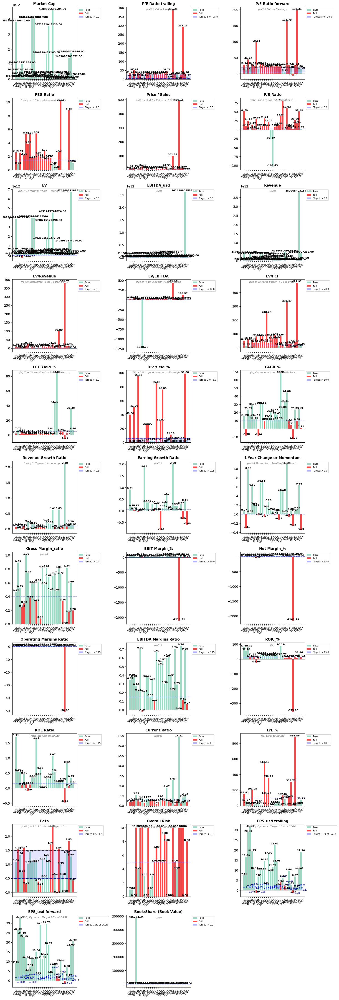

In [9]:
# Plot financial Ratios
functions.plot_ratios(fa_df, metrics_config, plots_per_row=3)

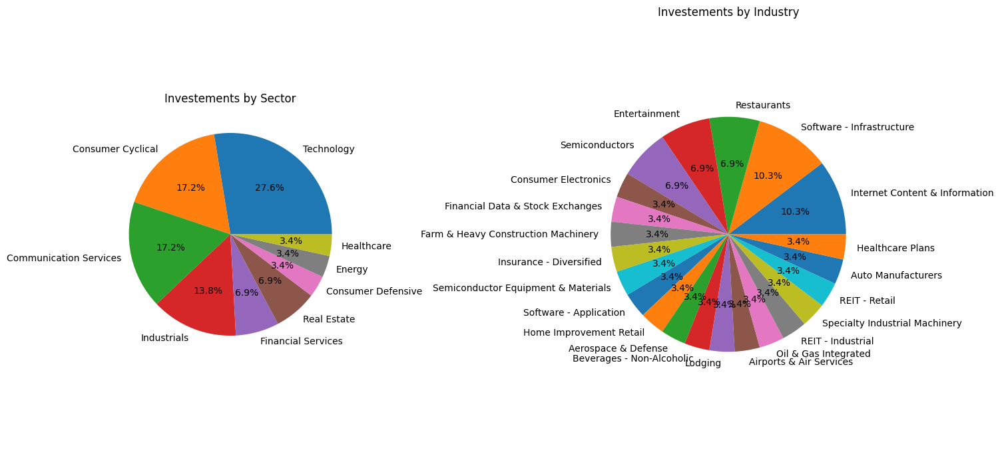

In [10]:
# Sectors and Industries
functions.print_sector_industry(fa_df)

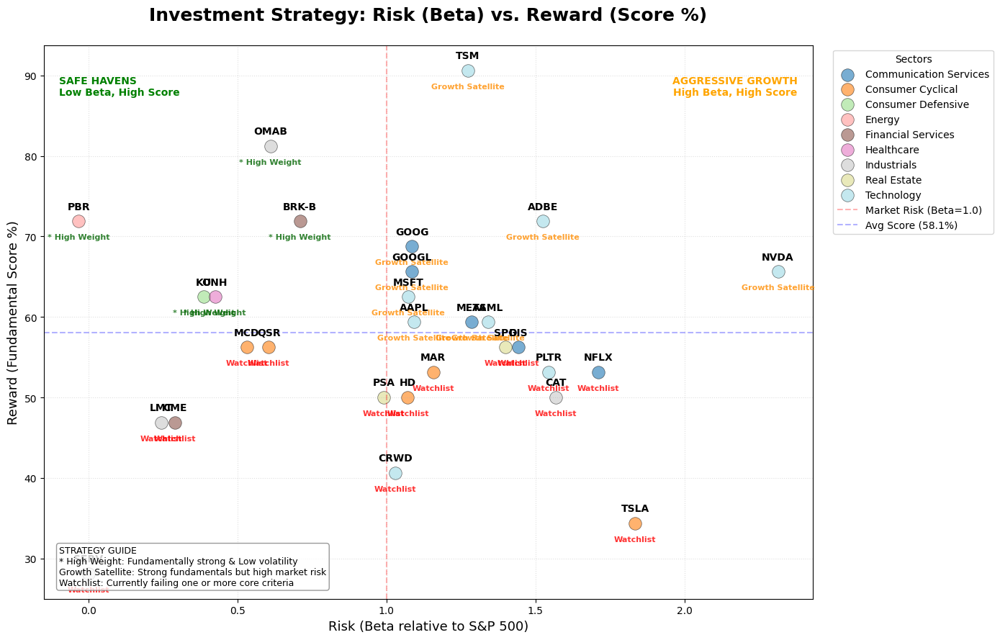

In [11]:
# --- SCORE vs BETA by Sector ---
functions.plot_risk_reward(fa_df, metrics_config)

In [12]:
# --- TOP N assets in all sectors ---

# 1. Get the Top 10 assets (in long format)
top_N_data = functions.get_top_N_assets(fa_df, metrics_config, top_n=10)
# 2. Plot the Treemap (using the existing plot_sector_treemap function)
functions.plot_sector_treemap(top_N_data)

# Grouping the top 5 to see the distribution
summary = top_N_data.groupby(['Sector', 'Industry', 'Name', 'Ticker'])[['Score %']].max().sort_values('Score %', ascending=False)

# Display the summary table
display(summary.style.background_gradient(cmap='Greens'))


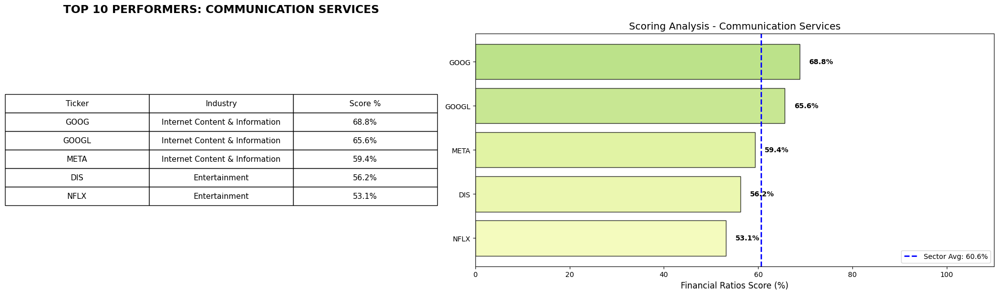

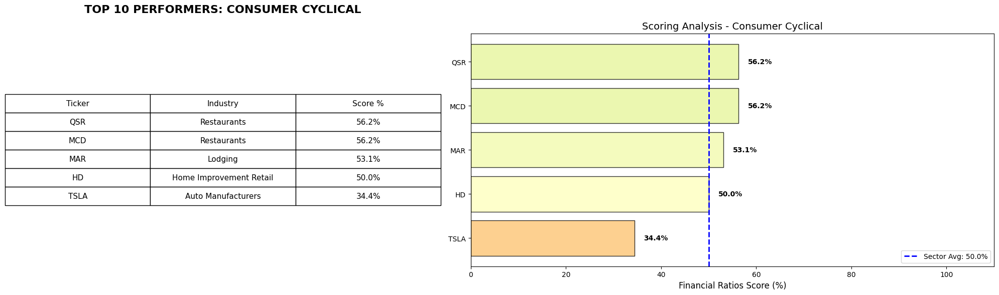

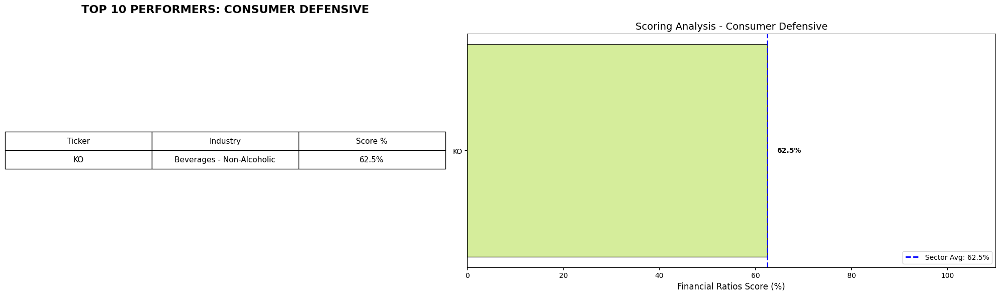

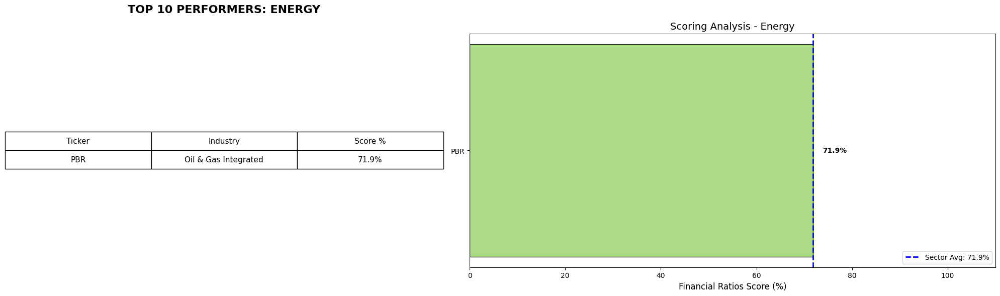

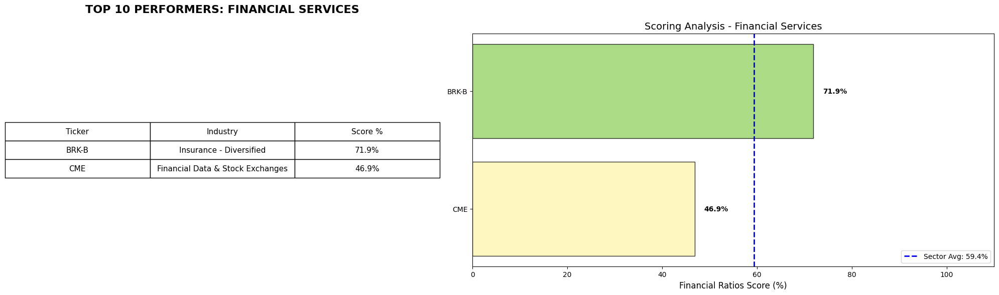

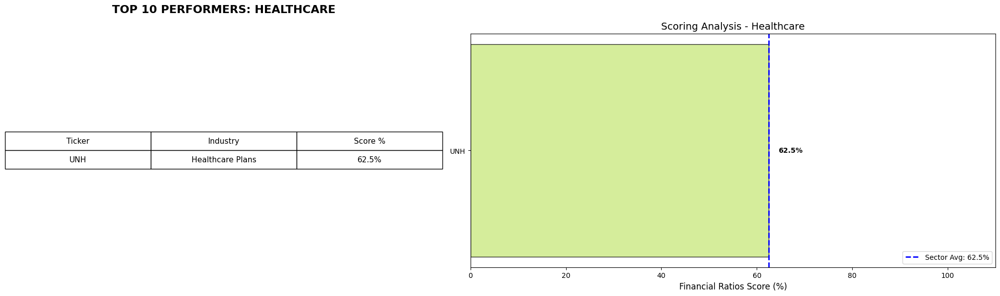

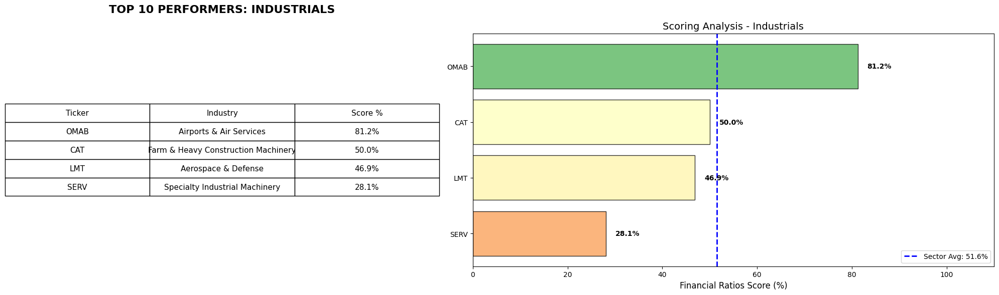

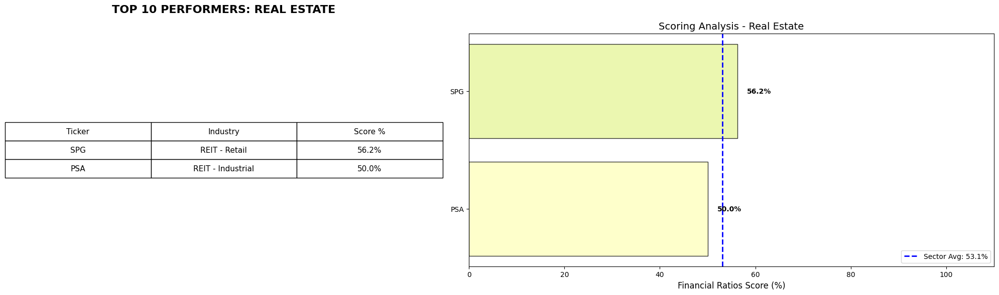

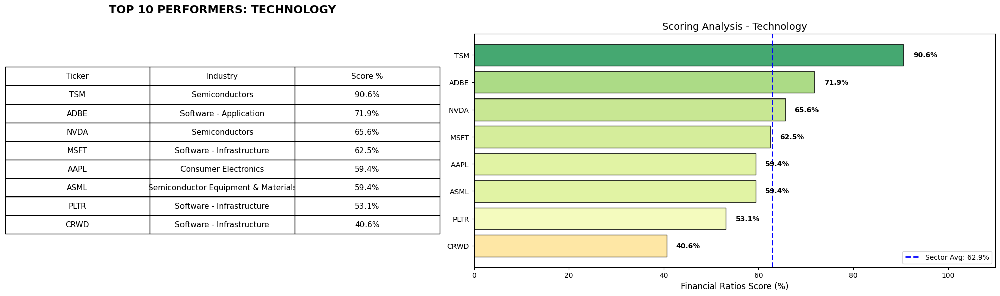

In [13]:
# TOP N BY SECTOR AND INDUSTRY

functions.top_N_sector_industry(fa_df, metrics_config, n_per_sector=10)



In [14]:
# TOP 1 BY SECTOR

final_picks = functions.top_1_sector(fa_df, metrics_config)
print("\n--- FINAL BEST-IN-CLASS PORTFOLIO SELECTION ---")
print("--- TOP 1 BY SECTOR ---")
display(final_picks.style.hide(axis="index").background_gradient(subset=['Score %'], cmap='RdYlGn'))



--- FINAL BEST-IN-CLASS PORTFOLIO SELECTION ---
--- TOP 1 BY SECTOR ---


Sector,Industry,Ticker,Score %
Technology,Semiconductors,TSM,90.625000
Industrials,Airports & Air Services,OMAB,81.250000
Energy,Oil & Gas Integrated,PBR,71.875000
Financial Services,Insurance - Diversified,BRK-B,71.875000
Communication Services,Internet Content & Information,GOOG,68.750000
Healthcare,Healthcare Plans,UNH,62.500000
Consumer Defensive,Beverages - Non-Alcoholic,KO,62.500000
Real Estate,REIT - Retail,SPG,56.250000
Consumer Cyclical,Restaurants,QSR,56.250000


In [15]:
comparison_table = functions.display_combined_strategy_comparison(fa_df, metrics_config, top_n=10)
display(comparison_table)

--- STRATEGY COMPARISON MATRIX ---


,All Assets,Top 10 Overall,Best-in-Class (Sector)
Total Tickers,29,10,9
Avg Score_%,58.1%,71.2%,69.1%
Avg Beta,1.02,1.01,0.72
Character,MARKET-NEUTRAL,MARKET-NEUTRAL,CONSERVATIVE / DEFENSIVE
Included Tickers,"TSM, OMAB, PBR, BRK-B, ADBE, GOOG, NVDA, GOOGL, UNH, MSFT, KO, AAPL, ASML, META, SPG, QSR, MCD, DIS, PLTR, NFLX, MAR, CAT, PSA, HD, CME, LMT, CRWD, TSLA, SERV","TSM, OMAB, PBR, BRK-B, ADBE, GOOG, NVDA, GOOGL, UNH, MSFT","TSM, OMAB, PBR, BRK-B, GOOG, UNH, KO, SPG, QSR"


Dividends, Splits and Recommendations

Gathering intelligence for 45 tickers...


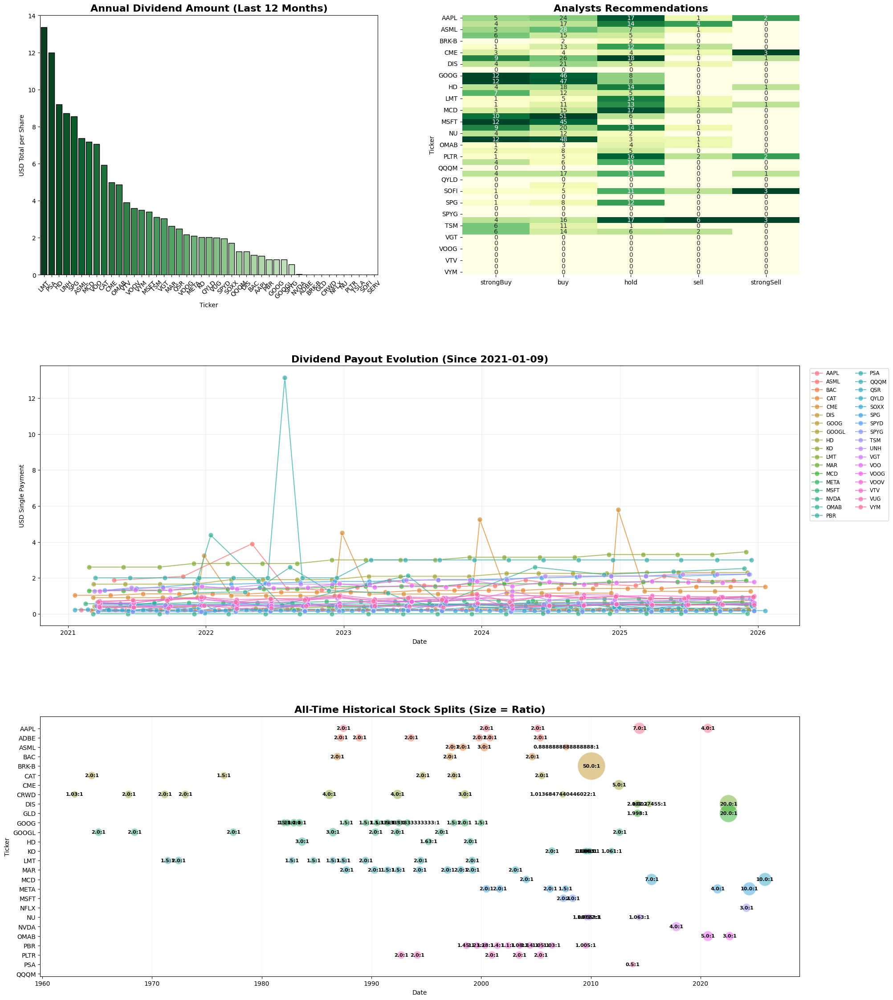

In [16]:
functions.print_dividends_splits_recommendations(tickers, start_date, today)

# Quantitative Analysis ALL Tickets

## Import Prices from yfinance (All Tickers)

**[TS302_Stock Full Analysis.ipynb](<../TS302_Stock Full Analysis.ipynb>)**

In [17]:
# import data from yahoo Finance
print(f"Number of days since Brokerage account was opened: {no_days}")
df = yf.download(tickers, start=start_date, end=today, auto_adjust=True)
df.info()

[****                   9%                       ]  4 of 45 completed

Number of days since Brokerage account was opened: 1844 days, 0:00:00


[*********************100%***********************]  45 of 45 completed

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1266 entries, 2021-01-11 to 2026-01-26
Columns: 225 entries, ('Close', 'AAPL') to ('Volume', 'VYM')
dtypes: float64(182), int64(43)
memory usage: 2.2 MB


## Prices (Close)

In [18]:
prices_raw = df["Close"]
print('-- Last 5 days of prices --')
display(prices_raw.tail(5))


-- Last 5 days of prices --


Ticker,AAPL,ADBE,ASML,BAC,BRK-B,CAT,CME,CRWD,DIS,GLD,...,TSLA,TSM,UNH,VGT,VOO,VOOG,VOOV,VTV,VUG,VYM
Date,,,,,,,,,,,,,,,,,,,,,
2026-01-20,246.699997,290.369995,1326.069946,52.099998,485.390015,629.000000,279.910004,442.730011,110.339996,437.230011,...,419.250000,327.160004,338.429993,738.690002,623.150024,436.000000,206.470001,195.729996,472.570007,146.570007
2026-01-21,247.649994,294.230011,1360.089966,52.070000,483.829987,645.380005,279.070007,445.880005,113.190002,443.600006,...,431.440002,326.119995,347.750000,748.599976,630.289978,440.309998,209.289993,198.460007,477.049988,148.279999
2026-01-22,248.350006,299.730011,1395.000000,52.450001,484.489990,648.409973,281.390015,453.769989,113.209999,451.790009,...,449.359985,327.369995,354.470001,754.250000,633.570007,443.559998,209.830002,198.779999,480.989990,148.440002
2026-01-23,248.039993,301.070007,1389.040039,51.720001,478.970001,626.619995,282.739990,452.489990,110.980003,458.000000,...,449.059998,334.869995,356.260010,754.989990,633.830017,445.309998,208.990005,197.589996,483.500000,147.690002
2026-01-26,255.410004,304.720001,1413.349976,52.020000,483.470001,635.919983,284.049988,468.329987,111.309998,464.700012,...,435.200012,332.709991,351.640015,760.429993,637.090027,448.390015,209.869995,198.259995,486.779999,148.410004


In [19]:
# drop NaN (days without price)
prices = prices_raw.dropna()
display(prices.tail(5))



Ticker,AAPL,ADBE,ASML,BAC,BRK-B,CAT,CME,CRWD,DIS,GLD,...,TSLA,TSM,UNH,VGT,VOO,VOOG,VOOV,VTV,VUG,VYM
Date,,,,,,,,,,,,,,,,,,,,,
2026-01-20,246.699997,290.369995,1326.069946,52.099998,485.390015,629.000000,279.910004,442.730011,110.339996,437.230011,...,419.250000,327.160004,338.429993,738.690002,623.150024,436.000000,206.470001,195.729996,472.570007,146.570007
2026-01-21,247.649994,294.230011,1360.089966,52.070000,483.829987,645.380005,279.070007,445.880005,113.190002,443.600006,...,431.440002,326.119995,347.750000,748.599976,630.289978,440.309998,209.289993,198.460007,477.049988,148.279999
2026-01-22,248.350006,299.730011,1395.000000,52.450001,484.489990,648.409973,281.390015,453.769989,113.209999,451.790009,...,449.359985,327.369995,354.470001,754.250000,633.570007,443.559998,209.830002,198.779999,480.989990,148.440002
2026-01-23,248.039993,301.070007,1389.040039,51.720001,478.970001,626.619995,282.739990,452.489990,110.980003,458.000000,...,449.059998,334.869995,356.260010,754.989990,633.830017,445.309998,208.990005,197.589996,483.500000,147.690002
2026-01-26,255.410004,304.720001,1413.349976,52.020000,483.470001,635.919983,284.049988,468.329987,111.309998,464.700012,...,435.200012,332.709991,351.640015,760.429993,637.090027,448.390015,209.869995,198.259995,486.779999,148.410004


In [20]:
print(f"prices_raw shape: {prices_raw.shape}")
print(f"prices shape: {prices.shape}")

if len(prices) < len(prices_raw):
    print(f"Reduction of {(len(prices_raw) - len(prices))}")
    print(f"It can be noticed that the amount of rows in the dataframe dropped from {len(prices_raw)} to {len(prices)} after the drop.na() operation. This is because there are a couple of assets that are relatively new in the public market (post IPO).")


prices_raw shape: (1266, 45)
prices shape: (472, 45)
Reduction of 794
It can be noticed that the amount of rows in the dataframe dropped from 1266 to 472 after the drop.na() operation. This is because there are a couple of assets that are relatively new in the public market (post IPO).


In [21]:
print(f"Reminder: the original 'start_date' was: {start_date.date().strftime("%B %d, %Y")}, when the original portfolio was created.")

df_ = df['Close']
first_valid_dates = df_.apply(pd.Series.first_valid_index)
first_valid_dates.name = "First Valid Date"
first_valid_dates = first_valid_dates.sort_values(ascending=False)


print(f"\nThe asset with the smallest amount of data available is: '{first_valid_dates.index[0]}' starting from '{first_valid_dates.iloc[0].date().strftime("%B %d, %Y")}' only.")

print("\nOldest available dates for each asset:")
display(first_valid_dates)



Reminder: the original 'start_date' was: January 09, 2021, when the original portfolio was created.

The asset with the smallest amount of data available is: 'SERV' starting from 'March 08, 2024' only.

Oldest available dates for each asset:


Ticker
SERV    2024-03-08
NU      2021-12-09
AAPL    2021-01-11
SPYD    2021-01-11
PSA     2021-01-11
QQQM    2021-01-11
QSR     2021-01-11
QYLD    2021-01-11
SOFI    2021-01-11
SOXX    2021-01-11
SPG     2021-01-11
SPYG    2021-01-11
PBR     2021-01-11
TSLA    2021-01-11
TSM     2021-01-11
UNH     2021-01-11
VGT     2021-01-11
VOO     2021-01-11
VOOG    2021-01-11
VOOV    2021-01-11
VTV     2021-01-11
VUG     2021-01-11
PLTR    2021-01-11
OMAB    2021-01-11
ADBE    2021-01-11
GOOG    2021-01-11
ASML    2021-01-11
BAC     2021-01-11
BRK-B   2021-01-11
CAT     2021-01-11
CME     2021-01-11
CRWD    2021-01-11
DIS     2021-01-11
GLD     2021-01-11
GOOGL   2021-01-11
NVDA    2021-01-11
HD      2021-01-11
KO      2021-01-11
LMT     2021-01-11
MAR     2021-01-11
MCD     2021-01-11
META    2021-01-11
MSFT    2021-01-11
NFLX    2021-01-11
VYM     2021-01-11
Name: First Valid Date, dtype: datetime64[ns]

In [22]:
# -- PLOT ASSET PRICES --
functions.plot_prices(prices=prices, yaxis_label="Price (USD)")


## Stats (describe)



In [23]:
# statistics about prices
prices.describe()

Ticker,AAPL,ADBE,ASML,BAC,BRK-B,CAT,CME,CRWD,DIS,GLD,...,TSLA,TSM,UNH,VGT,VOO,VOOG,VOOV,VTV,VUG,VYM
count,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,...,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000,472.000000
mean,223.541053,433.479851,849.993273,43.615072,468.488051,395.339005,237.577574,389.986832,105.554866,282.485318,...,307.345360,204.921096,438.103687,621.932927,538.955065,367.634282,184.919252,170.445423,408.937135,127.023129
std,28.390837,78.356312,158.172827,5.921527,36.203773,87.607794,32.870185,81.927860,10.253173,61.653925,...,96.020702,53.384664,103.995944,84.200389,52.893496,47.859472,11.339669,11.937088,50.250561,10.137764
min,163.664917,290.369995,590.981628,33.286674,396.730011,270.221863,183.360397,217.889999,80.826134,199.710007,...,142.050003,124.747917,234.701340,468.845581,445.161987,283.491333,160.399719,148.670639,319.818909,109.263657
25%,206.341614,357.104996,721.726456,38.404346,447.357491,337.143044,204.459881,321.009995,97.240616,231.715000,...,222.695000,166.527828,333.593468,557.503830,498.186920,331.752716,175.352844,161.519161,370.489784,118.832777
50%,224.663948,437.235001,803.483917,43.472670,474.104996,359.844421,243.285103,380.039993,109.797695,267.065002,...,310.324997,191.557396,471.921112,609.000763,534.908661,362.108810,184.223778,170.118462,405.600143,126.598839
75%,241.569927,499.542488,964.336746,47.477817,496.477509,415.429184,268.978241,463.329994,112.967085,311.122490,...,397.384995,237.360878,529.514664,689.319290,581.026825,409.815605,192.572220,177.894936,454.066551,134.458599
max,286.190002,586.549988,1413.349976,57.250000,539.799988,648.409973,286.685760,557.530029,123.176605,464.700012,...,489.880005,342.399994,607.890686,800.707397,639.340027,454.862305,210.389999,198.779999,503.744995,148.869995


## Normalized Prices

**Normalize to 100**

**Normalizar** precios de diferentes **magnitudes** dividiendo entre el primer registro. Todos los precios parten del mismo punto que es el 100.


$$
\frac {P_t}{P_0} * 100
$$

Nota: esto ya no es mas el Precio al Cierre sino un indice de crecimiento en el tiempo.

In [24]:
# Normalized Prices

prices_normalized = (prices / prices.iloc[0]) * 100


# -- PLOT ASSET PRICES --
functions.plot_prices(prices=prices_normalized, yaxis_label="Price (USD)")


## Daily Returns

**[TS303_yfinance Indices Bursatiles.ipynb](<../TS303_yfinance Indices Bursatiles.ipynb>)**


Normal (simple or arithmetic) returns:

$$Return(R_t) = \frac{P_t - P_{t-1}}{P_{t-1}} = \frac {P_t}{P_{t-1}} -1 $$

In [25]:
# Daily Returns. Using pct_change()
# Normal (simple or arithmetic) returns
# Expresed in FRACTION.
# If Percentage is needed then multiply by 100.
daily_returns = prices.pct_change(fill_method=None)
daily_returns = daily_returns.dropna()
daily_returns.tail(5)

Ticker,AAPL,ADBE,ASML,BAC,BRK-B,CAT,CME,CRWD,DIS,GLD,...,TSLA,TSM,UNH,VGT,VOO,VOOG,VOOV,VTV,VUG,VYM
Date,,,,,,,,,,,,,,,,,,,,,
2026-01-20,-0.034556,-0.019418,-0.023922,-0.016424,-0.016015,-0.025380,0.001467,-0.024566,-0.007734,0.037836,...,-0.041714,-0.044509,0.022385,-0.026695,-0.020343,-0.024128,-0.016622,-0.013308,-0.025810,-0.015450
2026-01-21,0.003851,0.013293,0.025655,-0.000576,-0.003214,0.026041,-0.003001,0.007115,0.025829,0.014569,...,0.029076,-0.003179,0.027539,0.013416,0.011458,0.009885,0.013658,0.013948,0.009480,0.011667
2026-01-22,0.002827,0.018693,0.025667,0.007298,0.001364,0.004695,0.008313,0.017695,0.000177,0.018463,...,0.041535,0.003833,0.019324,0.007547,0.005204,0.007381,0.002580,0.001612,0.008259,0.001079
2026-01-23,-0.001248,0.004471,-0.004272,-0.013918,-0.011393,-0.033605,0.004798,-0.002821,-0.019698,0.013745,...,-0.000668,0.022910,0.005050,0.000981,0.000410,0.003945,-0.004003,-0.005987,0.005218,-0.005053
2026-01-26,0.029713,0.012123,0.017501,0.005800,0.009395,0.014842,0.004633,0.035006,0.002973,0.014629,...,-0.030864,-0.006450,-0.012968,0.007205,0.005143,0.006917,0.004211,0.003391,0.006784,0.004875


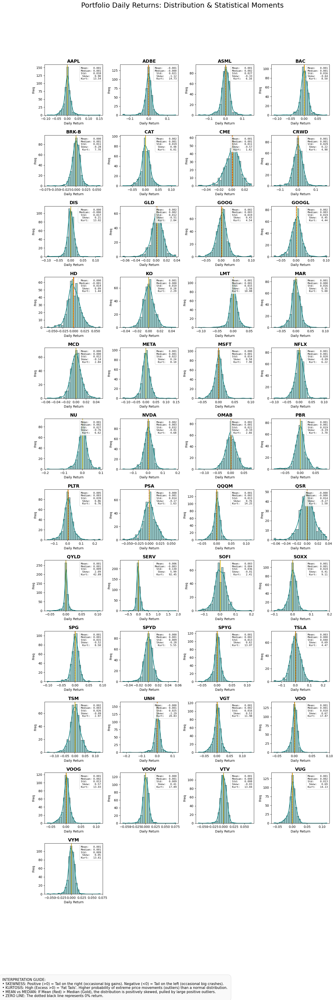


FAT-TAIL RISK RANKING (Sorted by Highest Kurtosis)


,Mean,Median,Std Dev,Skewness,Kurtosis
Ticker,,,,,
SERV,0.0059,-0.0034,0.1301,5.9919,92.4453
QYLD,0.0005,0.0006,0.0093,2.0865,42.8933
UNH,-0.0002,0.0006,0.0250,-2.2898,20.8328
VOOV,0.0005,0.0006,0.0085,0.4078,17.8942
VOO,0.0007,0.0011,0.0101,0.6721,17.8742
ADBE,-0.0010,-0.0001,0.0214,-1.1233,14.7251
QQQM,0.0009,0.0016,0.0132,0.7608,14.2499
VUG,0.0009,0.0015,0.0132,0.6880,14.1257
VTV,0.0006,0.0005,0.0084,-0.0344,13.8412


In [26]:
results_df = functions.plot_returns_distributions(daily_returns, num_cols=4)

In [27]:
# -- PLOT DAILY RETURNS --
functions.plot_daily_returns(daily_returns)

## Summary of Daily Returns

In [28]:
# stats and summary of daily retutns
print(f"Number of days of evaluation: {(today - daily_returns.index[0]).days}")
print(f"since {daily_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

max_daily_return = daily_returns.describe().loc['max'].sort_values(ascending=False)
print(f"\nThe asset with the biggest Return in a single day is '{max_daily_return.index[0]}' with {100*max_daily_return.iloc[0]:,.5}%")

min_daily_return = daily_returns.describe().loc['min'].sort_values(ascending=True)
print(f"The asset with the lowest Return in a single day is '{min_daily_return.index[0]}' with {100*min_daily_return.iloc[0]:,.5}%")

average_daily_returns = daily_returns.mean()
print(f"The average of all Daily Returns is {average_daily_returns.mean()*100:,.4}%")

max_std = daily_returns.describe().loc['std'].sort_values(ascending=False)
print(f"\nThe asset with the biggest StdDev in Daily Returns is '{max_std.index[0]}' with {100*max_std.iloc[0]:,.5}%")
print(f"The asset with the smallest StdDev in Daily Returns is '{max_std.index[-1]}' with {100*max_std.iloc[-1]:,.5}%")

Number of days of evaluation: 687
since March 11, 2024 until January 27, 2026

The asset with the biggest Return in a single day is 'SERV' with 187.07%
The asset with the lowest Return in a single day is 'SERV' with -77.647%
The average of all Daily Returns is 0.1149%

The asset with the biggest StdDev in Daily Returns is 'SERV' with 13.014%
The asset with the smallest StdDev in Daily Returns is 'VTV' with 0.83659%


## Annualized Returns

In [29]:
# Annualized Returns
annualized_return_tickers = daily_returns.mean() * 250
annualized_return_tickers.name = "Annualized Returns:"
annualized_return_tickers = annualized_return_tickers.sort_values(ascending=False)
print("Annualized Returns (%):")
print(f"{round(annualized_return_tickers, 2)* 100}")


Annualized Returns (%):
Ticker
SERV     147.0
PLTR     118.0
SOFI      81.0
TSLA      68.0
TSM       53.0
GOOGL     53.0
NVDA      53.0
GOOG      52.0
GLD       46.0
OMAB      41.0
CAT       39.0
NU        35.0
CRWD      30.0
SOXX      29.0
ASML      29.0
AAPL      26.0
BAC       25.0
SPYG      24.0
VOOG      24.0
VGT       24.0
NFLX      23.0
VUG       22.0
QQQM      22.0
META      21.0
LMT       21.0
CME       20.0
VOO       19.0
SPG       18.0
PBR       17.0
MAR       17.0
VYM       16.0
VTV       15.0
KO        15.0
QYLD      13.0
VOOV      12.0
SPYD      12.0
BRK-B     11.0
MSFT      11.0
MCD        7.0
HD         7.0
DIS        5.0
PSA        4.0
QSR       -3.0
UNH       -6.0
ADBE     -26.0
Name: Annualized Returns:, dtype: float64


## Cumulative Returns in Period

**[TS303_yfinance Indices Bursatiles.ipynb](<../TS303_yfinance Indices Bursatiles.ipynb>)**

In [30]:
# cumprod(): calculates the total return over a period by compounding the daily returns. (a)(ab)(abc)
# It reflects how an initial investment would grow if it were continuously reinvested and earned the daily returns.
cumulative_returns = (1 + daily_returns).cumprod()
cumulative_returns = (cumulative_returns - 1)*100
print("Cumulative Returns in %:")
cumulative_returns.tail(5)

Cumulative Returns in %:


Ticker,AAPL,ADBE,ASML,BAC,BRK-B,CAT,CME,CRWD,DIS,GLD,...,TSLA,TSM,UNH,VGT,VOO,VOOG,VOOV,VTV,VUG,VYM
Date,,,,,,,,,,,,,,,,,,,,,
2026-01-20,45.675891,-47.367182,35.481250,52.474210,20.399361,90.824760,39.438819,37.131796,2.040927,116.847692,...,139.106883,129.734255,-26.388422,43.213862,35.868143,47.506147,22.177500,29.474721,40.564127,31.883227
2026-01-21,46.236863,-46.667511,38.956990,52.386416,20.012401,95.794093,39.020370,38.107479,4.676573,120.006941,...,146.059092,129.003953,-24.361237,45.135163,37.424898,48.964292,23.846215,31.280614,41.896680,33.421872
2026-01-22,46.650219,-45.670574,42.523661,53.498515,20.176113,96.713319,40.176095,40.551334,4.695066,124.068838,...,156.279226,129.881712,-22.899576,46.230564,38.140058,50.063822,24.165762,31.492288,43.068619,33.565843
2026-01-23,46.467157,-45.427685,41.914746,51.362122,18.806898,90.102719,40.848594,40.154865,2.632796,127.148732,...,156.108137,135.148270,-22.510233,46.374030,38.196749,50.655876,23.668699,30.705105,43.815212,32.890995
2026-01-26,50.819134,-44.766082,44.398432,52.240090,19.923108,92.924130,41.501177,45.061167,2.937971,130.471656,...,148.203503,133.631499,-23.515123,47.428713,38.907543,51.697898,24.189428,31.148307,44.790835,33.538850


In [31]:
# -- PLOT CUMULATIVE RETURNS --
functions.plot_cumulative_returns(cumulative_returns)

## Final Cumulated Returns in Period

In [32]:
# Rendimientos Acumulados al Final del Tiempo en (%) use .prod() y -1
print(f"Final Cumulative Returns in (%) in {(today - daily_returns.index[0]).days} days of evaluation: ")
print(f"since {daily_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

cumulative_returns_final = cumulative_returns.iloc[-1]
cumulative_returns_final.name = "Final Cumulative Returns (%)"
cumulative_returns_final = round(cumulative_returns_final.sort_values(ascending=False) , 1)
print("Final Cumulative Returns in %:")
display(cumulative_returns_final.all)

Final Cumulative Returns in (%) in 687 days of evaluation: 
since March 11, 2024 until January 27, 2026
Final Cumulative Returns in %:


<bound method Series.all of Ticker
PLTR     543.1
SOFI     234.6
TSLA     148.2
GOOGL    148.0
GOOG     146.6
TSM      133.6
GLD      130.5
NVDA     113.1
OMAB      93.2
CAT       92.9
NU        64.2
SOXX      52.4
BAC       52.2
SPYG      51.8
VOOG      51.7
AAPL      50.8
VGT       47.4
CRWD      45.1
VUG       44.8
ASML      44.4
QQQM      44.2
NFLX      41.7
CME       41.5
LMT       40.9
VOO       38.9
SPG       33.9
META      33.7
VYM       33.5
VTV       31.1
KO        29.3
MAR       28.8
PBR       26.4
QYLD      25.9
VOOV      24.2
SPYD      23.2
BRK-B     19.9
MSFT      17.3
MCD       11.5
HD         8.1
PSA        3.1
DIS        2.9
QSR       -9.7
UNH      -23.5
ADBE     -44.8
SERV     -49.9
Name: Final Cumulative Returns (%), dtype: float64>

## Summary Final Cumulated Returns

In [33]:

print(f"Number of days of evaluation (period): {(today - cumulative_returns.index[0]).days}")
print(f"From {cumulative_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

print(f"The asset with the best cumulated return in the Period '{cumulative_returns_final.index[0]}' with {cumulative_returns_final.iloc[0]:,.5}% in the period")
print(f"The asset with the worst cumulative return in the Period '{cumulative_returns_final.index[-1]}' with {cumulative_returns_final.iloc[-1]:,.5}% in the period")

Number of days of evaluation (period): 687
From March 11, 2024 until January 27, 2026
The asset with the best cumulated return in the Period 'PLTR' with 543.1% in the period
The asset with the worst cumulative return in the Period 'SERV' with -49.9% in the period


## Risk, Annualized Volatility

**[TS303_yfinance Indices Bursatiles.ipynb](<../TS303_yfinance Indices Bursatiles.ipynb>)**

Asset Volatility (risk or std)

$$
\sigma = risk = \sqrt{\frac {\sum(r - \bar{r})^2}{n-1}}
$$

In [34]:
# Yearly volatility (risk)

# StdDev of daily returns in a 252-days year
annualized_volatility = daily_returns.std() * np.sqrt(252)

# Percentage (%)
annualized_volatility_percent = annualized_volatility * 100

# DataFrame of Annualized Volatility
volatility_df = pd.DataFrame(annualized_volatility_percent, columns=["Volatility (%)"])

print("Annualized Assets Volatility:")

volatility_df = round(volatility_df.sort_values(by="Volatility (%)", ascending=False), 2)

display(volatility_df)

Annualized Assets Volatility:


,Volatility (%)
Ticker,
SERV,206.59
TSLA,64.08
PLTR,62.42
SOFI,57.47
NVDA,50.05
CRWD,45.33
ASML,43.33
NU,42.44
TSM,40.62


Stats of Volatility

In [35]:
display(volatility_df.describe()) # all stocks

,Volatility (%)
count,45.000000
mean,32.628444
std,29.441877
min,13.280000
25%,20.730000
50%,25.230000
75%,34.990000
max,206.590000


## Summary Risk, Volatility

In [36]:
# summary and stats

print(f"Number of days of evaluation: {(today - cumulative_returns.index[0]).days}")
print(f"From {cumulative_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

print(f"The asset with the biggest Annualized Volatility is '{volatility_df.index[0]}' with a {volatility_df.iloc[0].values[0]:,.5} %")
print(f"The asset with the lowest Annualized Volatility is '{volatility_df.index[-1]}' with a {volatility_df.iloc[-1].values[0]:,.5} %")
print(f"The Average Annualized Volatility of all assets is: {volatility_df.mean().values[0]:,.5} %")

Number of days of evaluation: 687
From March 11, 2024 until January 27, 2026
The asset with the biggest Annualized Volatility is 'SERV' with a 206.59 %
The asset with the lowest Annualized Volatility is 'VTV' with a 13.28 %
The Average Annualized Volatility of all assets is: 32.628 %


## Dividend Yields (%)

In [37]:
# ANNUAL DIVIDEND YIELDS
yields = functions.plot_annual_dividnd_yields(daily_returns)

Annual Dividend Yields from yf 'dividendYield' (%):


AAPL      0.40
ADBE      0.00
ASML      0.51
BAC       2.15
BRK-B     0.00
CAT       0.95
CME       1.76
CRWD      0.00
DIS       1.36
GLD       0.00
GOOG      0.25
GOOGL     0.25
HD        2.42
KO        2.77
LMT       2.32
MAR       0.85
MCD       2.37
META      0.31
MSFT      0.76
NFLX      0.00
NU        0.00
NVDA      0.02
OMAB      4.08
PBR      11.18
PLTR      0.00
PSA       4.32
QQQM      0.50
QSR       3.67
QYLD     11.55
SERV      0.00
SOFI      0.00
SOXX      0.57
SPG       4.77
SPYD      4.53
SPYG      0.52
TSLA      0.00
TSM       0.99
UNH       3.13
VGT       0.40
VOO       1.13
VOOG      0.49
VOOV      1.76
VTV       2.05
VUG       0.41
VYM       2.44
Name: dividendYield, dtype: float64

# Initial Portfolio (Original)

## Assets Weights

Compute Assets weights from the original portfolio

In [38]:
# call the original portfolio [Ticker, Current QTY]
file_df

# Close prices df
close_prices = prices.iloc[-1]
close_prices.name = "Close Price"

# Merge original df with Close Prices
weights_df = pd.merge(file_df, close_prices, on='Ticker', how='inner')

# Add column of Amount Invested for each asset
weights_df['Investment'] = weights_df["Current QTY"] * weights_df["Close Price"]

# Calculate the Total Invested
Total_invested = weights_df['Investment'].sum()
print(f"Total Invested: ${Total_invested:,.2f}")

# Add column of weights of each asset
weights_df['Weights'] = weights_df['Investment'] / Total_invested
print(f"The sum of the weights is: {weights_df['Weights'].sum()}")

weights_df.set_index('Ticker', inplace=True)
weights_df.sort_values(by='Investment', ascending=False, inplace=True)
print("Sorted by Invested amount ($):")
display(round(weights_df, 2))


Total Invested: $69,347.04
The sum of the weights is: 0.9999999999999997
Sorted by Invested amount ($):


,Current QTY,Price,Mkt Value,Est Dividend Yield,Weight,Close Price,Investment,Weights
Ticker,,,,,,,,
NVDA,100.53,186.50,18748.63,4.00,0.23,186.47,18745.61,0.27
MSFT,19.75,483.62,9552.48,66.63,0.12,470.28,9288.99,0.13
AAPL,17.04,271.86,4632.50,17.47,0.06,255.41,4352.20,0.06
PLTR,21.02,177.75,3736.94,0.00,0.05,167.47,3520.82,0.05
TSM,10.03,303.89,3049.42,23.22,0.04,332.71,3338.62,0.05
GLD,6.45,396.31,2555.94,0.00,0.03,464.70,2997.01,0.04
VOOG,6.30,444.59,2799.30,15.19,0.03,448.39,2823.22,0.04
VOOV,10.36,204.85,2123.18,40.70,0.03,209.87,2175.21,0.03
TSLA,4.92,449.72,2214.70,0.00,0.03,435.20,2143.20,0.03


TO-DO: Grafica de Pastel con los Porcentajes

Grafica por Sectores, Industrias

## Portfolio Daily Returns

In [39]:
#checking the shapes of the objects to multiply
# Daily Returns Expresed in FRACTION.
print("Portfolio daily returns = [Daily Returns] x [weights]")
print(f"daily_returns shape: {daily_returns.shape}")
print(f"weights_df shape: {weights_df['Weights'].shape}")
print(f"Matrix multiplication [{daily_returns.shape[0]} x {daily_returns.shape[1]}] x [{weights_df['Weights'].shape[0]} x 1] = [{daily_returns.shape[0]} x 1]")

Portfolio daily returns = [Daily Returns] x [weights]
daily_returns shape: (471, 45)
weights_df shape: (45,)
Matrix multiplication [471 x 45] x [45 x 1] = [471 x 1]


In [40]:
# option 1: Portfolio's Daily Returns: Matrix multiplication (see above)
portfolio_daily_returns = (daily_returns @ weights_df['Weights'])

# option 2: Portfolio's Daily Returns: weighted sum of the daily returns of each asset
# portfolio_daily_returns = (daily_returns * weights_df['Weights']).sum(axis=1)


portfolio_daily_returns.name = 'portfolio daily returns'
print("portfolio_daily_returns:")
display(portfolio_daily_returns) # Expresed in FRACTION (not percentage)

portfolio_daily_returns:


Date
2024-03-11   -0.009019
2024-03-12    0.027362
2024-03-13   -0.005954
2024-03-14   -0.008929
2024-03-15   -0.009627
                ...   
2026-01-20   -0.022808
2026-01-21    0.011545
2026-01-22    0.010474
2026-01-23    0.011856
2026-01-26    0.001847
Name: portfolio daily returns, Length: 471, dtype: float64

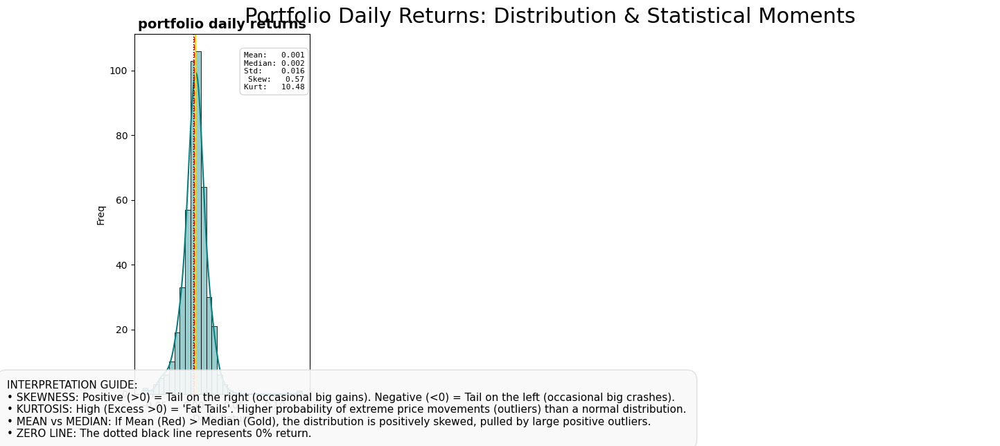


FAT-TAIL RISK RANKING (Sorted by Highest Kurtosis)


,Mean,Median,Std Dev,Skewness,Kurtosis
Ticker,,,,,
portfolio daily returns,0.0015,0.0023,0.0161,0.5723,10.4771


In [41]:
results_df = functions.plot_returns_distributions(pd.DataFrame(portfolio_daily_returns), num_cols=4)

In [42]:
# -- PLOT DAILY RETURNS --
functions.plot_daily_returns(pd.DataFrame(portfolio_daily_returns))

## Portfolio Annualized Returns

In [43]:
# Annualized Returns
annualized_return_portfolio = portfolio_daily_returns.mean() * 250
print("Annualized Returns (%):")
print(f"{round(annualized_return_portfolio, 2) * 100}%")

Annualized Returns (%):
37.0%


## Portfolio Cumulative Returns

In [44]:
# Portfolio's Cumulative daily Returns
portfolio_cumulative_returns = (1 + portfolio_daily_returns).cumprod()
portfolio_cumulative_returns = (portfolio_cumulative_returns - 1) * 100
portfolio_cumulative_returns = portfolio_cumulative_returns.rename('portfolio cumulative returns')
print("Portfolio Daily Cumulative Returns:")
display(portfolio_cumulative_returns)

Portfolio Daily Cumulative Returns:


Date
2024-03-11    -0.901906
2024-03-12     1.809647
2024-03-13     1.203491
2024-03-14     0.299842
2024-03-15    -0.665704
                ...    
2026-01-20    81.952694
2026-01-21    84.053355
2026-01-22    85.981158
2026-01-23    88.186148
2026-01-26    88.533747
Name: portfolio cumulative returns, Length: 471, dtype: float64

In [45]:
# -- PLOT CUMULATIVE RETURNS --
functions.plot_cumulative_returns(pd.DataFrame(portfolio_cumulative_returns))

Portfolio Cumulative Final

In [46]:
# Portfolio's final comulated return
portafolio_cumulative_final = portfolio_cumulative_returns.iloc[-1]
print(f"portafolio_cumulative Returns_final: {portafolio_cumulative_final:,.4}%")

portafolio_cumulative Returns_final: 88.53%


## Portfolio Volatility (Annualized)

In [47]:
# Compute annualized Volatility of the Portfolio
portfolio_annualized_volatility = portfolio_daily_returns.std() * np.sqrt(252)

# Convert to percentage
portfolio_annualized_volatility_perc = portfolio_annualized_volatility * 100

print(f"Portfolio Annualized Volatility: {portfolio_annualized_volatility_perc:,.4}%")

Portfolio Annualized Volatility: 25.56%


## Portfolio Sharpe Ratio

$$ Sharpe = \frac{R_p - R_f}{\sigma_p} = \frac{\mu_p - r_f}{\sigma_p}$$

Where:
* $R_p$: Expected Portfolio Return, $\mu$ (average rate of return)
* $R_f$: Risk Free Rate (can be 0 if ignored)
* $\sigma_p$: Portfolio Risk (StdDev) Standard Deviation of the portfolio's excess return.

In [48]:
portfolio_annualized_return = portfolio_daily_returns.mean()*252 #Annualized
portfolio_sr = round((portfolio_annualized_return - (risk_free))/portfolio_annualized_volatility, 2)
print(f"Portfolio Sharpe Ratio: {portfolio_sr}")

Portfolio Sharpe Ratio: 1.33


## Summary

In [49]:
print(f"Number of days of evaluation: {(today - cumulative_returns.index[0]).days} days")
print(f"From {cumulative_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

print(f"\nTotal Invested: ${Total_invested:,.2f}")
print(f"Portafolio_cumulative returns_final (all period): {portafolio_cumulative_final:,.4}%")
print(f"Portfolio Annualized Average Returns: {portfolio_annualized_return:,.4%}")
print(f"Portfolio Annualized Volatility: {portfolio_annualized_volatility_perc:,.4}%")
print(f"Portfolio Sharpe Ratio: {portfolio_sr}")



Number of days of evaluation: 687 days
From March 11, 2024 until January 27, 2026

Total Invested: $69,347.04
Portafolio_cumulative returns_final (all period): 88.53%
Portfolio Annualized Average Returns: 37.1890%
Portfolio Annualized Volatility: 25.56%
Portfolio Sharpe Ratio: 1.33


# Benchmarks (Indices)

## Daily Index Levels

In [50]:
# Benchmark Indices
benchmark_indices = {
    "EE.UU. (S&P 500)": "^GSPC",
    "EE.UU. (NASDAQ)": "^IXIC",
    "EE.UU. (DJIA)": "^DJI",
    "EE.UU. (Russell 100)": "^RUI",
    "México (IPC)": "^MXX",
    "Japón (Nikkei 225)": "^N225",
    "Alemania (DAX)": "^GDAXI",
    "Reino Unido (FTSE 100)": "^FTSE"
}

# get data from yahoo finance
benchmarks_prices = yf.download(list(benchmark_indices.values()), start=first_valid_dates.iloc[0], end=today, auto_adjust=True)["Close"]

# Rename columns
benchmarks_prices.columns = list(benchmark_indices.keys())

print("Benchmark Indices levels:")
display(benchmarks_prices.tail(5))

[*********************100%***********************]  8 of 8 completed

Benchmark Indices levels:


,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100)
Date,,,,,,,,
2026-01-20,48488.589844,10126.799805,24703.119141,6796.859863,22954.320312,67683.382812,52991.101562,3715.270020
2026-01-21,49077.230469,10138.099609,24560.980469,6875.620117,23224.820312,68036.132812,52774.640625,3758.199951
2026-01-22,49384.011719,10150.099609,24856.470703,6913.350098,23436.019531,68347.976562,53688.890625,3778.750000
2026-01-23,49098.710938,10143.400391,24900.710938,6915.609863,23501.240234,68195.148438,53846.871094,3777.739990
2026-01-26,49412.398438,10148.900391,24933.080078,6950.229980,23601.359375,68706.031250,52885.250000,3795.110107


In [51]:
# -- PLOT ASSET PRICES --
functions.plot_prices(prices=benchmarks_prices, yaxis_label="Index Level")

## Normalized Index Levels

In [52]:
# Normalized Index Levels
benchmarks_prices_normalized = (benchmarks_prices / benchmarks_prices.iloc[0]) * 100

# -- PLOT ASSET PRICES --
functions.plot_prices(prices=benchmarks_prices_normalized, yaxis_label="Index Level")

## Daily Returns

In [53]:
# Daily Returns
daily_returns_bm = benchmarks_prices.pct_change(fill_method=None)

# limpieza básica de daily_returns (elimina la primera fila con NaN)
daily_returns_bm = daily_returns_bm.dropna()
daily_returns_bm.tail(5)

,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100)
Date,,,,,,,,
2026-01-16,-0.001681,-0.000352,-0.002180,-0.000642,-0.000622,0.007379,-0.003222,-0.000714
2026-01-21,0.012140,0.001116,-0.005754,0.011588,0.011784,0.005212,-0.004085,0.011555
2026-01-22,0.006251,0.001184,0.012031,0.005488,0.009094,0.004584,0.017324,0.005468
2026-01-23,-0.005777,-0.000660,0.001780,0.000327,0.002783,-0.002236,0.002943,-0.000267
2026-01-26,0.006389,0.000542,0.001300,0.005006,0.004260,0.007491,-0.017858,0.004598


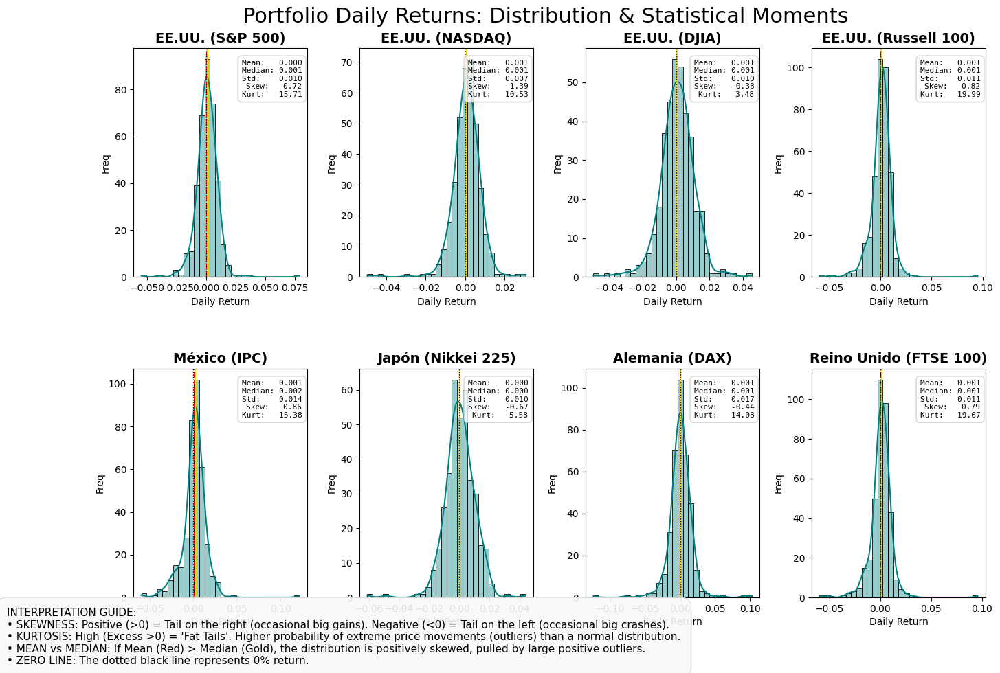


FAT-TAIL RISK RANKING (Sorted by Highest Kurtosis)


,Mean,Median,Std Dev,Skewness,Kurtosis
Ticker,,,,,
EE.UU. (Russell 100),0.0007,0.0012,0.0107,0.8184,19.9859
Reino Unido (FTSE 100),0.0007,0.0012,0.0108,0.7942,19.6745
EE.UU. (S&P 500),0.0005,0.0008,0.0096,0.7201,15.7119
México (IPC),0.0011,0.0022,0.0143,0.8595,15.3826
Alemania (DAX),0.0006,0.0007,0.0171,-0.4384,14.0786
EE.UU. (NASDAQ),0.0006,0.0009,0.0073,-1.3873,10.5339
Japón (Nikkei 225),0.0004,0.0004,0.0100,-0.6662,5.5777
EE.UU. (DJIA),0.0007,0.0007,0.0102,-0.3836,3.4817


In [54]:
results_df = functions.plot_returns_distributions(daily_returns_bm, num_cols=4)

In [55]:
functions.plot_daily_returns(daily_returns_bm)

## Annualized Returns

In [56]:
# Annualized Returns
annualized_return_bm = daily_returns_bm.mean() * 252
annualized_return_bm.name = "Annualized Returns (%):"
annualized_return_bm = annualized_return_bm.sort_values(ascending=False)
print("Annualized Returns (%):")
print(round(annualized_return_bm, 2)*100)


Annualized Returns (%):
México (IPC)              28.0
EE.UU. (Russell 100)      19.0
EE.UU. (DJIA)             18.0
Reino Unido (FTSE 100)    18.0
Alemania (DAX)            15.0
EE.UU. (NASDAQ)           14.0
EE.UU. (S&P 500)          13.0
Japón (Nikkei 225)        11.0
Name: Annualized Returns (%):, dtype: float64


## Cumulative Daily Returns

In [57]:
cumulative_returns_bm = (1 + daily_returns_bm).cumprod()
cumulative_returns_bm = (cumulative_returns_bm - 1) * 100
display(cumulative_returns_bm.tail(5))

,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100)
Date,,,,,,,,
2026-01-16,15.822090,21.208332,26.652690,25.350166,40.552241,12.782702,18.357092,24.204955
2026-01-21,17.228144,21.343580,25.923946,26.802691,42.208548,13.370499,17.873621,25.640143
2026-01-22,17.960936,21.487209,27.438922,27.498521,43.501747,13.890133,19.915624,26.327150
2026-01-23,17.279453,21.407026,27.665741,27.540197,43.901102,13.635471,20.268477,26.293385
2026-01-26,18.028742,21.472856,27.831698,28.178674,44.514144,14.486770,18.120670,26.874084


In [58]:
functions.plot_cumulative_returns(cumulative_returns_bm)

In [59]:
# Final Cumulative Return in the period of evaluation for all Indices
print("Final Cumulative Returns (%)")
# cumulative_returns_final_bm = (1 + daily_returns_bm).prod() -1
cumulative_returns_final_bm = cumulative_returns_bm.iloc[-1]
cumulative_returns_final_bm = cumulative_returns_final_bm.sort_values(ascending=False)
cumulative_returns_final_bm = cumulative_returns_final_bm.rename("final cumulative returns Benchmarks (%)")
display(cumulative_returns_final_bm)

Final Cumulative Returns (%)


México (IPC)              44.514144
EE.UU. (Russell 100)      28.178674
EE.UU. (DJIA)             27.831698
Reino Unido (FTSE 100)    26.874084
EE.UU. (NASDAQ)           21.472856
Alemania (DAX)            18.120670
EE.UU. (S&P 500)          18.028742
Japón (Nikkei 225)        14.486770
Name: final cumulative returns Benchmarks (%), dtype: float64

## Volatility

In [60]:
#Annualized Volatility
annualized_volatility_bm = daily_returns_bm.std() * np.sqrt(252)

#Annualized Volatility Percentage
annualized_volatility_bm_perc = annualized_volatility_bm * 100

annualized_volatility_bm_perc.rename('Volatility Benchmarks (%)', inplace=True)

print("Volatility of Benchmark Indices (%):")
annualized_volatility_bm_perc.sort_values(ascending=False, inplace=True)
display(annualized_volatility_bm_perc)

Volatility of Benchmark Indices (%):


Alemania (DAX)            27.098969
México (IPC)              22.622021
Reino Unido (FTSE 100)    17.193199
EE.UU. (Russell 100)      17.018532
EE.UU. (DJIA)             16.252128
Japón (Nikkei 225)        15.888150
EE.UU. (S&P 500)          15.170636
EE.UU. (NASDAQ)           11.594179
Name: Volatility Benchmarks (%), dtype: float64

## Sharpe Ratios

$$ Sharpe = \frac{R_p - R_f}{\sigma_p} = \frac{\mu_p - r_f}{\sigma_p}$$

Where:
* $R_p$: Expected Portfolio Return, $\mu$
* $R_f$: Risk Free Rate (can be 0 if ignored)
* $\sigma_p$: Portfolio Risk (StdDev)

In [61]:
# Sharpe Ratios
benchmark_sr = round((annualized_return_bm - (risk_free))/annualized_volatility_bm, 2)
benchmark_sr.rename('Sharpe Ratio', inplace=True)
benchmark_sr.sort_values(ascending=False, inplace=True)
display(benchmark_sr)

México (IPC)              1.09
EE.UU. (NASDAQ)           0.93
EE.UU. (DJIA)             0.92
EE.UU. (Russell 100)      0.90
Reino Unido (FTSE 100)    0.85
EE.UU. (S&P 500)          0.61
Japón (Nikkei 225)        0.46
Alemania (DAX)            0.44
Name: Sharpe Ratio, dtype: float64

## Summary

In [62]:
# Days of evaluation
no_days_compare = today.date() - first_valid_dates.iloc[0].date()
print(f"\nNumber of days of evaluation: {no_days_compare.days} days.")
print(f"From: {first_valid_dates.iloc[0].date().strftime("%B %d, %Y")} to: {today.date().strftime("%B %d, %Y")}")

# Summary Return and Volatility
print("\nSummary: Benchmark Indices:")
print(f"'{cumulative_returns_final_bm.index[0]}' has the largest total return {cumulative_returns_final_bm.iloc[0]:,.5}%")
print(f"and'{cumulative_returns_final_bm.index[-1]}' the lowest total return {cumulative_returns_final_bm.iloc[-1]:,.3}%")
print(f"\n'{annualized_volatility_bm_perc.index[0]}' has the largest volatility {annualized_volatility_bm_perc.iloc[0]:,.5}%")
print(f"and '{annualized_volatility_bm_perc.index[-1]}' the lowest volatility {annualized_volatility_bm_perc.iloc[-1]:,.5}%")



Number of days of evaluation: 690 days.
From: March 08, 2024 to: January 27, 2026

Summary: Benchmark Indices:
'México (IPC)' has the largest total return 44.514%
and'Japón (Nikkei 225)' the lowest total return 14.5%

'Alemania (DAX)' has the largest volatility 27.099%
and 'EE.UU. (NASDAQ)' the lowest volatility 11.594%


# Compare Initial Portfolio and Indices



## Daily Returns

Combine dataframes

In [63]:
# Combine Daily Returns of Initial Porfolio and
# Benchmark Indices in a single dataFrame to plot

# convert portfolio_daily_returns to datafre to merge it with Indices daily returns
portfolio_daily_returns_df = pd.DataFrame(portfolio_daily_returns)
portfolio_daily_returns_df.rename(columns={'portfolio daily returns':'Initial Portfolio'}, inplace=True)

# check if the lenghts of the dataframes match
if len(portfolio_daily_returns_df) != len(daily_returns_bm):
    print(f"Lengths of DataFrames don't match {len(portfolio_daily_returns_df)} vs {len(daily_returns_bm)} but a left merge will help")
    print("There are more dates in one dataframe than the other")


# Merge Daily Returns of Benchmark Indices and Initial Portfolio
# Note: Left-Merge on Benchmark daily returns because they don't operate on weekends or bank holidays
# thus we compare both benchmark and portfolio using the same labor day dates only.
merge_daily_returns = pd.merge(daily_returns_bm, portfolio_daily_returns_df, on='Date', how="left")
print("\nDaily Returns (merged portfolio and indices):")
display(merge_daily_returns.tail(5))

Lengths of DataFrames don't match 471 vs 365 but a left merge will help
There are more dates in one dataframe than the other

Daily Returns (merged portfolio and indices):


,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100),Initial Portfolio
Date,,,,,,,,,
2026-01-16,-0.001681,-0.000352,-0.002180,-0.000642,-0.000622,0.007379,-0.003222,-0.000714,-0.003513
2026-01-21,0.012140,0.001116,-0.005754,0.011588,0.011784,0.005212,-0.004085,0.011555,0.011545
2026-01-22,0.006251,0.001184,0.012031,0.005488,0.009094,0.004584,0.017324,0.005468,0.010474
2026-01-23,-0.005777,-0.000660,0.001780,0.000327,0.002783,-0.002236,0.002943,-0.000267,0.011856
2026-01-26,0.006389,0.000542,0.001300,0.005006,0.004260,0.007491,-0.017858,0.004598,0.001847


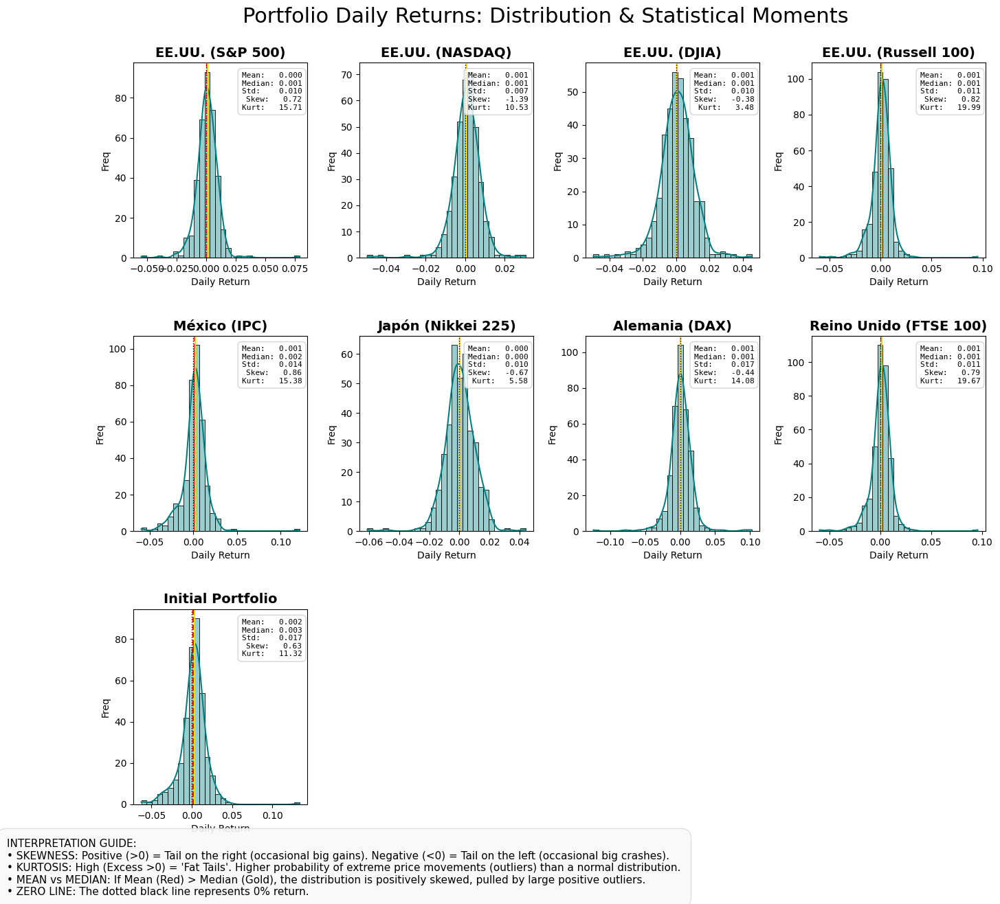


FAT-TAIL RISK RANKING (Sorted by Highest Kurtosis)


,Mean,Median,Std Dev,Skewness,Kurtosis
Ticker,,,,,
EE.UU. (Russell 100),0.0007,0.0012,0.0107,0.8184,19.9859
Reino Unido (FTSE 100),0.0007,0.0012,0.0108,0.7942,19.6745
EE.UU. (S&P 500),0.0005,0.0008,0.0096,0.7201,15.7119
México (IPC),0.0011,0.0022,0.0143,0.8595,15.3826
Alemania (DAX),0.0006,0.0007,0.0171,-0.4384,14.0786
Initial Portfolio,0.0019,0.0034,0.0168,0.6332,11.3160
EE.UU. (NASDAQ),0.0006,0.0009,0.0073,-1.3873,10.5339
Japón (Nikkei 225),0.0004,0.0004,0.0100,-0.6662,5.5777
EE.UU. (DJIA),0.0007,0.0007,0.0102,-0.3836,3.4817


In [64]:
results_df = functions.plot_returns_distributions(merge_daily_returns, num_cols=4)

In [65]:
functions.plot_daily_returns(merge_daily_returns)

## Cumulative Returns

In [66]:
# Combine Comulative Returns of Initial Porfolio and Benchmark Indices in a single dataFrame to plot

# convert portfolio_cumulative_returns to datafre to merge it with Indices returns
portfolio_cumulative_returns_df = pd.DataFrame(portfolio_cumulative_returns)
portfolio_cumulative_returns_df.rename(columns={'portfolio cumulative returns':'Initial Portfolio'}, inplace=True)

# check if the lenghts of the dataframes match
if len(portfolio_cumulative_returns_df) != len(cumulative_returns_bm):
    print(f"Lengths of DataFrames don't match {len(portfolio_cumulative_returns_df)} vs {len(cumulative_returns_bm)} but a left merge will help")


# Merge Cumulative Returns of Benchmark Indices and Initial Portfolio
# Note: Left-Merge on Benchmark cumulative returns because they don't operate on weekends or bank holidays
# thus we compare both benchmark and portfolio using the same labor day dates only.
merge_cumulative_returns = pd.merge(cumulative_returns_bm, portfolio_cumulative_returns_df, on='Date', how="left")
print("\nDaily Cumulative Returns (merged portfolio and indices):")
display(merge_cumulative_returns.tail(5))

Lengths of DataFrames don't match 471 vs 365 but a left merge will help

Daily Cumulative Returns (merged portfolio and indices):


,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100),Initial Portfolio
Date,,,,,,,,,
2026-01-16,15.822090,21.208332,26.652690,25.350166,40.552241,12.782702,18.357092,24.204955,86.199496
2026-01-21,17.228144,21.343580,25.923946,26.802691,42.208548,13.370499,17.873621,25.640143,84.053355
2026-01-22,17.960936,21.487209,27.438922,27.498521,43.501747,13.890133,19.915624,26.327150,85.981158
2026-01-23,17.279453,21.407026,27.665741,27.540197,43.901102,13.635471,20.268477,26.293385,88.186148
2026-01-26,18.028742,21.472856,27.831698,28.178674,44.514144,14.486770,18.120670,26.874084,88.533747


In [67]:
functions.plot_cumulative_returns(merge_cumulative_returns)

In [68]:
# Total Cumulative Returns
print("\nTotal (Final) cumulative Returns (%):")
merge_cumulative_returns_finals = merge_cumulative_returns.iloc[-1].copy()
merge_cumulative_returns_finals.rename('Final Cumulative Returns (%)', inplace=True)
merge_cumulative_returns_finals.sort_values(ascending=False, inplace=True)
display(merge_cumulative_returns_finals)



Total (Final) cumulative Returns (%):


Initial Portfolio         88.533747
México (IPC)              44.514144
EE.UU. (Russell 100)      28.178674
EE.UU. (DJIA)             27.831698
Reino Unido (FTSE 100)    26.874084
EE.UU. (NASDAQ)           21.472856
Alemania (DAX)            18.120670
EE.UU. (S&P 500)          18.028742
Japón (Nikkei 225)        14.486770
Name: Final Cumulative Returns (%), dtype: float64

## Volatility

In [69]:
# Anualized Volatility of portfolio + Benchmarks
print('\nAnnualized Volatility (%):')
merge_annualized_volatility = merge_daily_returns.std() * np.sqrt(252)
merge_annualized_volatility = merge_annualized_volatility * 100
merge_annualized_volatility.rename('Annualized Volatility (%)', inplace=True)
merge_annualized_volatility.sort_values(ascending=False, inplace=True)
display(merge_annualized_volatility)


Annualized Volatility (%):


Alemania (DAX)            27.098969
Initial Portfolio         26.645473
México (IPC)              22.622021
Reino Unido (FTSE 100)    17.193199
EE.UU. (Russell 100)      17.018532
EE.UU. (DJIA)             16.252128
Japón (Nikkei 225)        15.888150
EE.UU. (S&P 500)          15.170636
EE.UU. (NASDAQ)           11.594179
Name: Annualized Volatility (%), dtype: float64

## Sharpe Ratio

In [70]:
sharpe_ratio = pd.DataFrame()
sharpe_ratio['Annualized Returns (%)'] = merge_daily_returns.mean()*252*100 #Annualized returns
sharpe_ratio = pd.concat([sharpe_ratio['Annualized Returns (%)'], merge_annualized_volatility], axis=1)
sharpe_ratio['Sharpe Ratio'] = (sharpe_ratio['Annualized Returns (%)'] - (risk_free*100)) / (sharpe_ratio['Annualized Volatility (%)'])
sharpe_ratio.sort_values(by='Sharpe Ratio', ascending=False, inplace=True)
sharpe_ratio

,Annualized Returns (%),Annualized Volatility (%),Sharpe Ratio
Initial Portfolio,48.243523,26.645473,1.686723
México (IPC),27.966781,22.622021,1.090388
EE.UU. (NASDAQ),14.108140,11.594179,0.932204
EE.UU. (DJIA),18.278275,16.252128,0.921619
EE.UU. (Russell 100),18.582114,17.018532,0.897969
Reino Unido (FTSE 100),17.905206,17.193199,0.849476
EE.UU. (S&P 500),12.589405,15.170636,0.612328
Japón (Nikkei 225),10.606492,15.888150,0.459871
Alemania (DAX),15.187128,27.098969,0.438656


TO-do: Poner nota explicatoria de por que el SR es 1.58 aqui contra 1.3 arriba

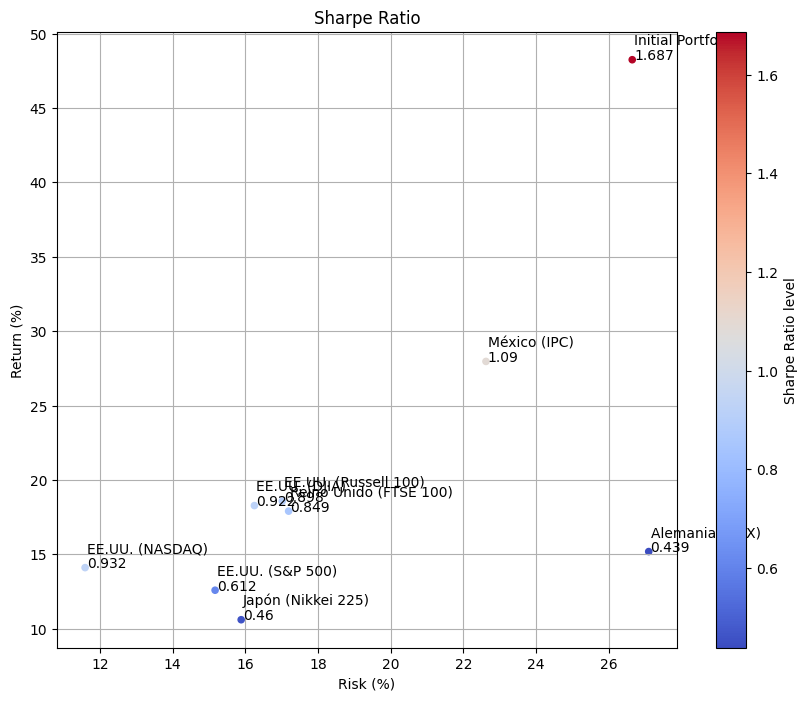

In [71]:
#fig, ax = plt.subplots()

ax = sharpe_ratio.plot.scatter(
                        x=sharpe_ratio.columns[1],
                        y=sharpe_ratio.columns[0],
                        c=sharpe_ratio.columns[2],
                        colormap='coolwarm',
                        alpha=1.0,
                        figsize=(10,8))
for i, label in enumerate(round(sharpe_ratio['Sharpe Ratio'],3)):
    ax.text(sharpe_ratio['Annualized Volatility (%)'].iloc[i] + 0.05, sharpe_ratio['Annualized Returns (%)'].iloc[i], label)
    ax.text(sharpe_ratio['Annualized Volatility (%)'].iloc[i] + 0.05, sharpe_ratio['Annualized Returns (%)'].iloc[i] + 1, sharpe_ratio.index[i])

ax.figure.axes[1].set_ylabel('Sharpe Ratio level')

plt.title('Sharpe Ratio')
plt.xlabel('Risk (%)')
plt.ylabel('Return (%)')
plt.grid()
plt.show()

## Summary

In [72]:
# Days of evaluation
no_days_compare = today.date() - first_valid_dates.iloc[0].date()
print(f"\nNumber of days of evaluation: {no_days_compare.days} days. From: {first_valid_dates.iloc[0].date().strftime("%B %d, %Y")} to: {today.date().strftime("%B %d, %Y")}")

# Summary Return, Volatility and Sharp Ratio
print("\nSummary: Benchmark Indices + Initial Portfolio")
print("\nReturns:")
print(f"'{merge_cumulative_returns_finals.index[0]}' has the largest total return {merge_cumulative_returns_finals.iloc[0]:,.5}%")
print(f"and'{merge_cumulative_returns_finals.index[-1]}' the lowest total return {merge_cumulative_returns_finals.iloc[-1]:,.3}%")
print("\nVolatility:")
print(f"'{merge_annualized_volatility.index[0]}' has the largest volatility {merge_annualized_volatility.iloc[0]:,.5}%")
print(f"and '{merge_annualized_volatility.index[-1]}' the lowest volatility {merge_annualized_volatility.iloc[-1]:,.5}%")
print("\nSharp Ratio:")
print(f"'{sharpe_ratio.index[0]}' has the best Sharpe Ratio {sharpe_ratio['Sharpe Ratio'].iloc[0]:,.4}")
print(f"and '{sharpe_ratio.index[-1]}' the worst Sharp Ratio {sharpe_ratio['Sharpe Ratio'].iloc[-1]:,.3}")


Number of days of evaluation: 690 days. From: March 08, 2024 to: January 27, 2026

Summary: Benchmark Indices + Initial Portfolio

Returns:
'Initial Portfolio' has the largest total return 88.534%
and'Japón (Nikkei 225)' the lowest total return 14.5%

Volatility:
'Alemania (DAX)' has the largest volatility 27.099%
and 'EE.UU. (NASDAQ)' the lowest volatility 11.594%

Sharp Ratio:
'Initial Portfolio' has the best Sharpe Ratio 1.687
and 'Alemania (DAX)' the worst Sharp Ratio 0.439


# Buy and Hold

## B&H - Stocks (Initial Portfolio)

Initial Investment $100,000 in each Asset

In [73]:
# B&H Stocks in initial Portfolio
functions.buy_and_hold_strategy(cumulative_returns, 100000, "Portfolio Stocks")


--- Investment Analysis: Portfolio Stocks ---
From: March 11, 2024 to January 26, 2026
Period: 686 days


,Initial_Value_USD,Final_Value_USD,Margin_USD,Yield_Perc
Ticker,,,,
PLTR,"100,000.00","643,125.94","543,125.94",543.13
SOFI,"100,000.00","334,630.34","234,630.34",234.63
TSLA,"100,000.00","248,203.50","148,203.50",148.20
GOOGL,"100,000.00","247,971.38","147,971.38",147.97
GOOG,"100,000.00","246,600.62","146,600.62",146.60
TSM,"100,000.00","233,631.50","133,631.50",133.63
GLD,"100,000.00","230,471.66","130,471.66",130.47
NVDA,"100,000.00","213,149.09","113,149.09",113.15
OMAB,"100,000.00","193,230.18","93,230.18",93.23


## B&H - Indices and Portfolio

Initial Investment $100,000 in each Index and Initial Portfolio

In [74]:
# B&H Indices & Portfolio (merged)
functions.buy_and_hold_strategy(merge_cumulative_returns, 100000, "Market Benchmarks Indices and Initital Portfolio")


--- Investment Analysis: Market Benchmarks Indices and Initital Portfolio ---
From: March 11, 2024 to January 26, 2026
Period: 686 days


,Initial_Value_USD,Final_Value_USD,Margin_USD,Yield_Perc
Ticker,,,,
Initial Portfolio,"100,000.00","188,533.75","88,533.75",88.53
México (IPC),"100,000.00","144,514.14","44,514.14",44.51
EE.UU. (Russell 100),"100,000.00","128,178.67","28,178.67",28.18
EE.UU. (DJIA),"100,000.00","127,831.70","27,831.70",27.83
Reino Unido (FTSE 100),"100,000.00","126,874.08","26,874.08",26.87
EE.UU. (NASDAQ),"100,000.00","121,472.86","21,472.86",21.47
Alemania (DAX),"100,000.00","118,120.67","18,120.67",18.12
EE.UU. (S&P 500),"100,000.00","118,028.74","18,028.74",18.03
Japón (Nikkei 225),"100,000.00","114,486.77","14,486.77",14.49


# Dollar Cost Averaging (DCA)

## DCA - Stocks (Initial Portfolio)

Monthly Investment $100 in each Asset

In [75]:
# For individual stocks
functions.dollar_cost_averaging_strategy(prices, monthly_investment=100, title_suffix="Individual Stocks")



--- DCA Investment Analysis: Individual Stocks ---


,Total_Invested,Final_Value_USD,Margin_USD,Yield_Perc_%
Ticker,,,,
PLTR,"2,300.00","7,074.31","4,774.31",207.58
SOFI,"2,300.00","4,837.99","2,537.99",110.35
GOOGL,"2,300.00","4,049.13","1,749.13",76.05
GOOG,"2,300.00","4,022.51","1,722.51",74.89
SERV,"2,300.00","3,967.95","1,667.95",72.52
TSM,"2,300.00","3,958.98","1,658.98",72.13
ASML,"2,300.00","3,940.37","1,640.37",71.32
GLD,"2,300.00","3,908.37","1,608.37",69.93
CAT,"2,300.00","3,785.80","1,485.80",64.60


## DCA - Indices

Monthly Investment $100 in each Asset

In [76]:
# For Benchmarks and your Portfolio Index
functions.dollar_cost_averaging_strategy(benchmarks_prices, monthly_investment=100, title_suffix="Indices & Portfolio")


--- DCA Investment Analysis: Indices & Portfolio ---


,Total_Invested,Final_Value_USD,Margin_USD,Yield_Perc_%
Ticker,,,,
Alemania (DAX),"2,300.00","2,980.13",680.13,29.57
México (IPC),"2,300.00","2,825.95",525.95,22.87
Japón (Nikkei 225),"2,300.00","2,825.93",525.93,22.87
EE.UU. (DJIA),"2,300.00","2,703.55",403.55,17.55
EE.UU. (Russell 100),"2,300.00","2,689.75",389.75,16.95
Reino Unido (FTSE 100),"2,300.00","2,685.59",385.59,16.76
EE.UU. (NASDAQ),"2,300.00","2,679.24",379.24,16.49
EE.UU. (S&P 500),"2,300.00","2,638.85",338.85,14.73


# Momentum (All Period)

Applied to all **Stocks** in Initial Portfolio

 -----  MOMENTUM of All Period: 689 days 00:00:00  --------

Momentum Ranking (Annual yield):


Ticker
PLTR     543.1
SOFI     234.6
TSLA     148.2
GOOGL    148.0
GOOG     146.6
TSM      133.6
GLD      130.5
NVDA     113.1
OMAB      93.2
CAT       92.9
NU        64.2
SOXX      52.4
BAC       52.2
SPYG      51.8
VOOG      51.7
AAPL      50.8
VGT       47.4
CRWD      45.1
VUG       44.8
ASML      44.4
QQQM      44.2
NFLX      41.7
CME       41.5
LMT       40.9
VOO       38.9
SPG       33.9
META      33.7
VYM       33.5
VTV       31.1
KO        29.3
MAR       28.8
PBR       26.4
QYLD      25.9
VOOV      24.2
SPYD      23.2
BRK-B     19.9
MSFT      17.3
MCD       11.5
HD         8.1
PSA        3.1
DIS        2.9
QSR       -9.7
UNH      -23.5
ADBE     -44.8
SERV     -49.9
Name: Final Cumulative Returns (%), dtype: float64

Inverse Momentum Ranking (Annual yield):


Ticker
SERV     -49.9
ADBE     -44.8
UNH      -23.5
QSR       -9.7
DIS        2.9
PSA        3.1
HD         8.1
MCD       11.5
MSFT      17.3
BRK-B     19.9
SPYD      23.2
VOOV      24.2
QYLD      25.9
PBR       26.4
MAR       28.8
KO        29.3
VTV       31.1
VYM       33.5
META      33.7
SPG       33.9
VOO       38.9
LMT       40.9
CME       41.5
NFLX      41.7
QQQM      44.2
ASML      44.4
VUG       44.8
CRWD      45.1
VGT       47.4
AAPL      50.8
VOOG      51.7
SPYG      51.8
BAC       52.2
SOXX      52.4
NU        64.2
CAT       92.9
OMAB      93.2
NVDA     113.1
GLD      130.5
TSM      133.6
GOOG     146.6
GOOGL    148.0
TSLA     148.2
SOFI     234.6
PLTR     543.1
Name: Final Cumulative Returns (%), dtype: float64

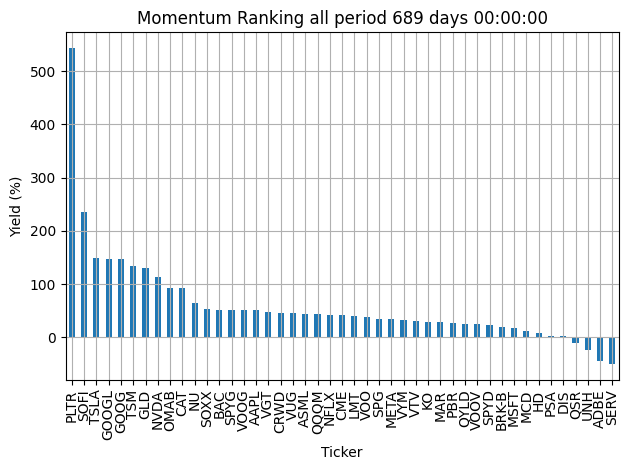

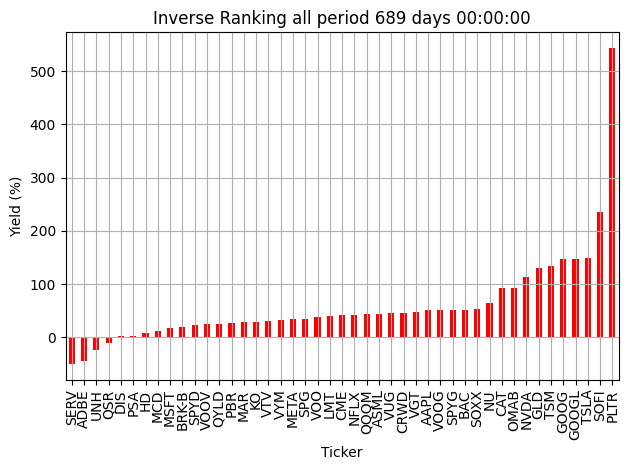

In [77]:
# call the DataFrame of the Final Cumulative Returns, which is the total return of each asset in the period.
cumulative_returns_final

print(f" -----  MOMENTUM of All Period: {(prices.index[-1] - prices.index[0])}  --------")

# MOMENTUM: Order from largest to lowest return
momentum_ranking = cumulative_returns_final.sort_values(ascending=False)
print("\nMomentum Ranking (Annual yield):")
display(momentum_ranking)

# Inverse Ranking
inverse_ranking = cumulative_returns_final.sort_values(ascending=True)
print("Inverse Momentum Ranking (Annual yield):")
display(inverse_ranking)


# Plot Momentum and Inverse momentum

plt.Figure(figsize=(12, 9))
momentum_ranking.plot(kind='bar', title=f'Momentum Ranking all period {(prices.index[-1] - prices.index[0])}')
plt.ylabel('Yield (%)')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.Figure(figsize=(12, 9))
inverse_ranking.plot(kind='bar', title=f'Inverse Ranking all period {(prices.index[-1] - prices.index[0])}', color='red')
plt.ylabel('Yield (%)')
plt.grid(True)
plt.tight_layout()
plt.show()


Applied to Indices

Momentum Ranking (Annual yield) of Benchmark Indices:


México (IPC)              44.514144
EE.UU. (Russell 100)      28.178674
EE.UU. (DJIA)             27.831698
Reino Unido (FTSE 100)    26.874084
EE.UU. (NASDAQ)           21.472856
Alemania (DAX)            18.120670
EE.UU. (S&P 500)          18.028742
Japón (Nikkei 225)        14.486770
Name: final cumulative returns Benchmarks (%), dtype: float64

Inverse Momentum Ranking (Annual yield) of Benchmark Indices:


Japón (Nikkei 225)        14.486770
EE.UU. (S&P 500)          18.028742
Alemania (DAX)            18.120670
EE.UU. (NASDAQ)           21.472856
Reino Unido (FTSE 100)    26.874084
EE.UU. (DJIA)             27.831698
EE.UU. (Russell 100)      28.178674
México (IPC)              44.514144
Name: final cumulative returns Benchmarks (%), dtype: float64

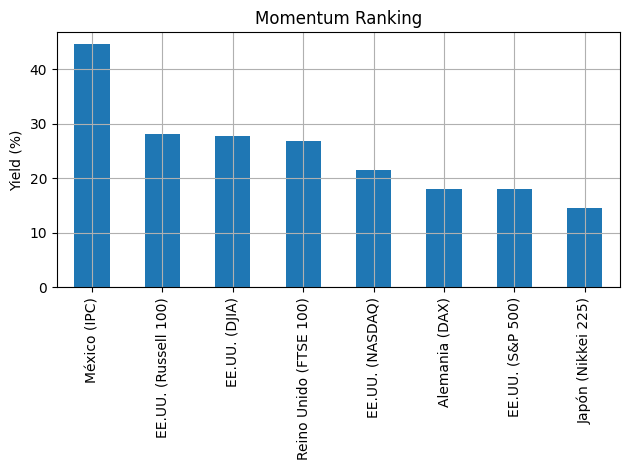

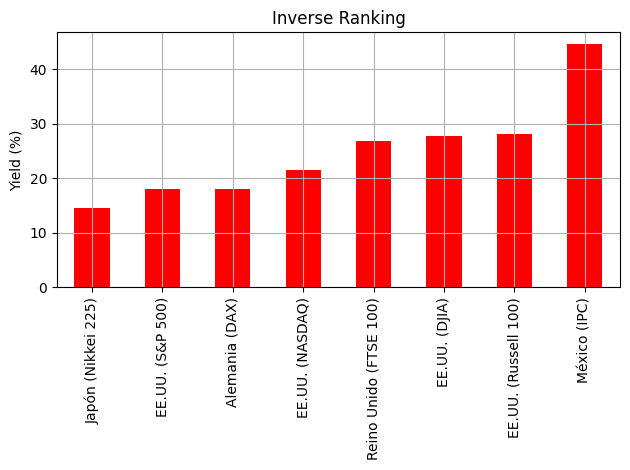

In [78]:
# call the DataFrame of the Final Cumulative Returns, which is the total return of each Index in the period.
cumulative_returns_final_bm

# MOMENTUM: Order from largest to lowest return
momentum_ranking_bm = cumulative_returns_final_bm.sort_values(ascending=False)
print("Momentum Ranking (Annual yield) of Benchmark Indices:")
display(momentum_ranking_bm)

# Inverse Ranking
inverse_ranking_bm = cumulative_returns_final_bm.sort_values(ascending=True)
print("Inverse Momentum Ranking (Annual yield) of Benchmark Indices:")
display(inverse_ranking_bm)

# Plot Momentum and Inverse momentum
plt.Figure(figsize=(12, 9))
momentum_ranking_bm.plot(kind='bar', title='Momentum Ranking')
plt.ylabel('Yield (%)')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.Figure(figsize=(12, 9))
inverse_ranking_bm.plot(kind='bar', title='Inverse Ranking', color='red')
plt.ylabel('Yield (%)')
plt.grid(True)
plt.tight_layout()
plt.show()


# Correlation


## Correlation equation

Pearson correlation coefficient:

$$\rho_{X,Y} = \frac {cov(X,Y)}{\sigma_X \sigma_Y} = \frac{E[(X-\mu_X)(Y-\mu_Y)]}{\sigma_X \sigma_Y}$$

$$
\sigma_p^2 = w_A^2 \sigma_A^2 \;+\; w_B^2 \sigma_B^2 \;+\; 2\,w_A w_B\,\rho_{AB}\,\sigma_A \sigma_B
$$

## Stocks

In [79]:
functions.plot_interactive_heatmap_correlation(daily_returns, triangle='half')
functions.plot_extreme_correlations(daily_returns, num_pairs=10)



REGRESSION & VOLATILITY SUMMARY TABLE


,Correlation (r),R-Squared,p-value,Slope (Beta),Std Error,Intercept (Alpha),Vol_GOOGL,Vol_GOOG,Significant?,Vol_VOOG,Vol_SPYG,Vol_VUG,Vol_QQQM,Vol_VYM,Vol_VTV,Vol_VGT,Vol_NVDA,Vol_KO,Vol_CME,Vol_ASML,Vol_TSM,Vol_SOXX
Pair,,,,,,,,,,,,,,,,,,,,,,
GOOGL vs GOOG,0.9979,0.9958,0.0000,0.9854,0.0030,0.0000,0.0190,0.0187,Yes,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
VOOG vs SPYG,0.9974,0.9949,0.0000,1.0014,0.0033,0.0000,nan,nan,Yes,0.0130,0.0131,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
VUG vs VOOG,0.9910,0.9821,0.0000,0.9838,0.0061,0.0001,nan,nan,Yes,0.0130,nan,0.0131,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
VUG vs SPYG,0.9884,0.9770,0.0000,0.9852,0.0070,0.0001,nan,nan,Yes,nan,0.0131,0.0131,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
SPYG vs QQQM,0.9863,0.9728,0.0000,0.9917,0.0077,-0.0001,nan,nan,Yes,nan,0.0131,nan,0.0132,nan,nan,nan,nan,nan,nan,nan,nan,nan
VOOG vs QQQM,0.9859,0.9720,0.0000,0.9952,0.0078,-0.0001,nan,nan,Yes,0.0130,nan,nan,0.0132,nan,nan,nan,nan,nan,nan,nan,nan,nan
VUG vs QQQM,0.9858,0.9718,0.0000,0.9879,0.0078,0.0000,nan,nan,Yes,nan,nan,0.0131,0.0132,nan,nan,nan,nan,nan,nan,nan,nan,nan
VYM vs VTV,0.9838,0.9678,0.0000,0.9620,0.0081,-0.0000,nan,nan,Yes,nan,nan,nan,nan,0.0085,0.0084,nan,nan,nan,nan,nan,nan,nan
VGT vs QQQM,0.9758,0.9522,0.0000,0.8094,0.0084,0.0001,nan,nan,Yes,nan,nan,nan,0.0132,nan,nan,0.0159,nan,nan,nan,nan,nan,nan



--------------------------------------------------
INTERPRETATION GUIDE:
--------------------------------------------------
• p-value Significance: Probability the correlation happened by chance. 
  Small values (e.g., < 1.42e-05) mean the relationship is mathematically solid.
• Significance?: 'Yes' if p_value < 0.05.
• Beta (Slope): The magnitude. A slope of 1.2 means for every 1% change in Stock A, 
  Stock B tends to move 1.2%.
• Alpha (Intercept): The 'excess' return of Stock B if Stock A's return was zero.
• Low Standard Error: Relationship is tight; Beta is a reliable predictor.
• High Standard Error: Lots of 'noise'; Beta is less reliable for hedging/pairs trading.
• Volatility (Vol):
  - High Vol + High Corr: High-octane comovers.
  - Low Vol + High Corr: Stable 'pairs trading' candidates.
  - Interpretation: If Vol Stock B > Vol Stock A, Beta will naturally be higher. 
    Check this to see if Beta is driven by correlation or just swing scale.


## Indices & Portfolio

In [80]:
functions.plot_interactive_heatmap_correlation(merge_daily_returns, triangle='half')
functions.plot_extreme_correlations(merge_daily_returns, num_pairs=10)


REGRESSION & VOLATILITY SUMMARY TABLE


,Correlation (r),R-Squared,p-value,Slope (Beta),Std Error,Intercept (Alpha),Vol_Reino Unido (FTSE 100),Vol_EE.UU. (Russell 100),Significant?,Vol_México (IPC),Vol_Initial Portfolio,Vol_EE.UU. (S&P 500),Vol_EE.UU. (DJIA),Vol_EE.UU. (NASDAQ)
Pair,,,,,,,,,,,,,,
Reino Unido (FTSE 100) vs EE.UU. (Russell 100),0.9990,0.9981,0.0000,0.9889,0.0023,0.0000,0.0108,0.0107,Yes,nan,nan,nan,nan,nan
México (IPC) vs EE.UU. (Russell 100),0.9681,0.9371,0.0000,0.7283,0.0099,-0.0001,nan,0.0107,Yes,0.0142,nan,nan,nan,nan
Reino Unido (FTSE 100) vs México (IPC),0.9651,0.9314,0.0000,1.2698,0.0181,0.0002,0.0108,nan,Yes,0.0142,nan,nan,nan,nan
Initial Portfolio vs México (IPC),0.9468,0.8964,0.0000,0.8038,0.0143,-0.0004,nan,nan,Yes,0.0142,0.0168,nan,nan,nan
Reino Unido (FTSE 100) vs EE.UU. (S&P 500),0.9051,0.8192,0.0000,0.7986,0.0197,-0.0001,0.0108,nan,Yes,nan,nan,0.0095,nan,nan
EE.UU. (Russell 100) vs EE.UU. (S&P 500),0.8990,0.8081,0.0000,0.8013,0.0205,-0.0001,nan,0.0107,Yes,nan,nan,0.0095,nan,nan
Initial Portfolio vs EE.UU. (Russell 100),0.8908,0.7935,0.0000,0.5689,0.0152,-0.0004,nan,0.0107,Yes,nan,0.0168,nan,nan,nan
Initial Portfolio vs Reino Unido (FTSE 100),0.8830,0.7797,0.0000,0.5698,0.0159,-0.0004,0.0108,nan,Yes,nan,0.0168,nan,nan,nan
México (IPC) vs EE.UU. (S&P 500),0.7883,0.6214,0.0000,0.5287,0.0217,-0.0001,nan,nan,Yes,0.0142,nan,0.0095,nan,nan



--------------------------------------------------
INTERPRETATION GUIDE:
--------------------------------------------------
• p-value Significance: Probability the correlation happened by chance. 
  Small values (e.g., < 1.42e-05) mean the relationship is mathematically solid.
• Significance?: 'Yes' if p_value < 0.05.
• Beta (Slope): The magnitude. A slope of 1.2 means for every 1% change in Stock A, 
  Stock B tends to move 1.2%.
• Alpha (Intercept): The 'excess' return of Stock B if Stock A's return was zero.
• Low Standard Error: Relationship is tight; Beta is a reliable predictor.
• High Standard Error: Lots of 'noise'; Beta is less reliable for hedging/pairs trading.
• Volatility (Vol):
  - High Vol + High Corr: High-octane comovers.
  - Low Vol + High Corr: Stable 'pairs trading' candidates.
  - Interpretation: If Vol Stock B > Vol Stock A, Beta will naturally be higher. 
    Check this to see if Beta is driven by correlation or just swing scale.


# Covariance

* 	La matriz de covarianza es la base para calcular la varianza del portafolio:

$$ \sigma_p^2 = w^T \Sigma w $$

donde:
* w = vector de pesos del portafolio.
* $\Sigma = matriz$ de covarianzas.
* Un gestor de portafolios busca combinaciones de activos con **baja covarianza** para reducir la volatilidad total manteniendo el rendimiento esperado.


*	Covariance:$$
\text{Cov}(X,Y) = E[(X - \mu_X)(Y - \mu_Y)]$$
*	Values:
	*	Positive → one rises, other rises too.
	*	Negative → one rises, other goes down.
	*	near 0 → there's no clear relationtip.

## Stocks

In [81]:
# Plot ANNUALIZED variance/covariance Matrix =  returns.cov() * 252
functions.plot_annualized_covariance_heatmap(daily_returns, triangle='half')

## Indices & Portfolio

In [82]:
# Plot ANNUALIZED variance/covariance Matrix =  returns.cov() * 252
functions.plot_annualized_covariance_heatmap(merge_daily_returns, triangle='half')

# Efficient Frontier (Sharpe Ratio)

$$ Sharpe = \frac{R_p - R_f}{\sigma_p} = \frac{\mu_p - r_f}{\sigma_p}$$

Where:
* $R_p$: Expected Portfolio Return, $\mu$
* $R_f$: Risk Free Rate (can be 0 if ignored)
* $\sigma_p$: Portfolio Risk (StdDev)

Long-only: weights $\,w_i\in[0,1]$ y $\sum w_i=1$.

* Only purchases, no leverage (by shorting)
* Pros: Less operating risk
* Cons: Frontier less efficient than with shorts (due leverage)

Shorts allowed: weights $\,w_i\in[-1,1]$ y $\sum w_i=1 \text{  (or similar)}$.

* One can short sell and compensate with long positions
* Pros: Theoretical improvement of the Frontier with more options
* Cons:: Implied leverage, Margin requirements, Costs and Operational Risk
  



## Stocks

In [83]:
# --- EFFICIENT FRONTIER & CAPITAL MARKET LINE ANALYSIS---

functions.run_full_frontier_analysis(rets=daily_returns,
                          curr_port_weights = weights_df['Weights'],
                          curr_port_vol = portfolio_annualized_volatility,
                          curr_port_ret = portfolio_annualized_return,
                          mean_ann = daily_returns.mean() * 252,
                          cov_ann = daily_returns.cov() * 252,
                          rf_default = risk_free,
                          long_only = True,  # Set to True for standard long-only constraints
                          portfolio_value = Total_invested, #70000
                          yields = yields/100
                          )



Number of starts: To avoid local minimas. 10-25 normal (fast and robust), 50-100 (for large amount of stocks)

In [84]:
no_starts = 25
no_simul = 2000000


Optimizing Sharpe…

Optimum Weights (%) - Tangency Portfolio
Ticker
AAPL      0.00
ADBE      0.00
ASML      0.00
BAC       0.00
BRK-B     0.00
CAT       2.99
CME      16.97
CRWD      0.00
DIS       0.00
GLD      39.06
GOOG      0.00
GOOGL    11.63
HD        0.00
KO       14.52
LMT       3.28
MAR       0.00
MCD       0.00
META      0.00
MSFT      0.00
NFLX      0.00
NU        0.00
NVDA      0.00
OMAB      1.96
PBR       0.00
PLTR      7.04
PSA       0.00
QQQM      0.00
QSR       0.00
QYLD      0.00
SERV      0.69
SOFI      0.00
SOXX      0.00
SPG       0.00
SPYD      0.00
SPYG      0.00
TSLA      0.00
TSM       1.87
UNH       0.00
VGT       0.00
VOO       0.00
VOOG      0.00
VOOV      0.00
VTV       0.00
VUG       0.00
VYM       0.00

Optimum Sharpe Ratio: 3.346
Expected Annual Return: 42.97%
Annual Risk: 11.85%

Simulating random Portfolios…

Simulated Portfolio with Minimum Volatility:
Volatility: 11.38%
Return: 23.93%
Sharpe Ratio: 1.814

Simulated Portfolio with Maximum Return:
Vol

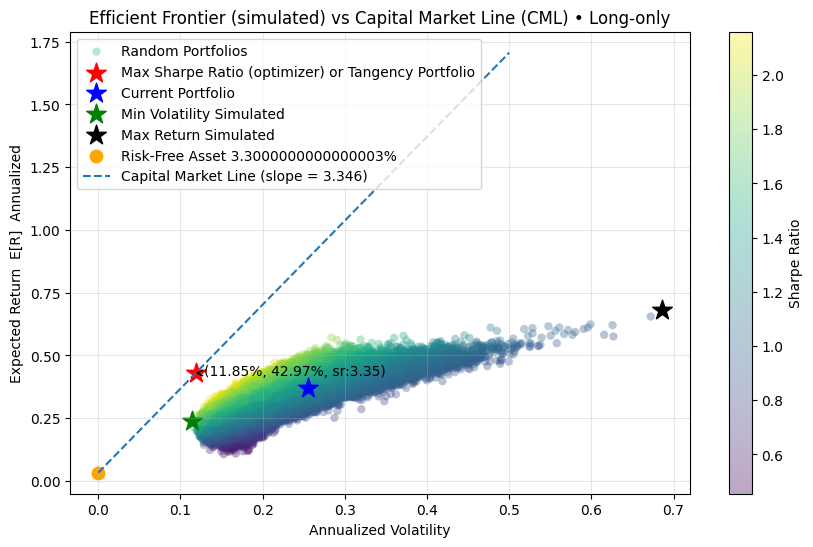

In [108]:
weights_optimal, vol_ret_sr_optimal = functions.efficient_froentier_sharp_ratio(
                daily_returns,
                [portfolio_annualized_volatility, portfolio_annualized_return],
                daily_returns.mean()*252, # Simple Arithmetic Mean Annualization
                daily_returns.cov()*252, #Annualized Covariance
                risk_free, #Risk Free
                True, # Long only = True, Short allowed = False
                no_starts, # no. of starts (25 default)
                no_simul, # no. of simulations
                123 # seed
                )

### Positions from current to optimal

In [109]:
# Recall Total Invested
Investment = Total_invested

# Current Portolio Weights and Positions
weights_df

# Optimal Weights from Efficient Frontier
weights_optimal

# Merge DataFrames
weights_df_Optimal = pd.merge(weights_df, weights_optimal, left_index=True, right_index=True, how='outer')

# New Investment (USD)
weights_df_Optimal['New Investment usd'] = weights_df_Optimal['Optimal Weights'] * Investment

# New QTY
weights_df_Optimal['New QTY'] = weights_df_Optimal['New Investment usd'] / weights_df_Optimal['Close Price']

# Difference in QTY or buy/sell position
weights_df_Optimal['Position_to_Optimal'] = weights_df_Optimal['New QTY'] - weights_df_Optimal['Current QTY']

weights_df_Optimal = round(weights_df_Optimal, 3)
display(weights_df_Optimal)

print(f"Current Investment: $ {round(Investment, 2)}")
print(f"New Investment: $ {round(weights_df_Optimal['New Investment usd'].sum(), 2)}")

,Current QTY,Price,Mkt Value,Est Dividend Yield,Weight,Close Price,Investment,Weights,Optimal Weights,New Investment usd,New QTY,Position_to_Optimal
Ticker,,,,,,,,,,,,
AAPL,17.040,271.86,4632.50,17.47,0.057,255.41,4352.196,0.063,0.000,0.000,0.000,-17.040
ADBE,0.465,349.99,162.78,0.00,0.002,304.72,141.722,0.002,0.000,0.000,0.000,-0.465
ASML,0.264,1069.86,282.62,1.65,0.004,1413.35,373.365,0.005,0.000,0.000,0.000,-0.264
BAC,1.469,55.00,80.79,1.55,0.001,52.02,76.410,0.001,0.000,0.000,0.000,-1.469
BRK-B,0.245,502.65,123.04,0.00,0.002,483.47,118.344,0.002,0.000,0.000,0.000,-0.245
CAT,0.334,572.87,191.48,1.94,0.002,635.92,212.557,0.003,0.030,2073.476,3.261,2.926
CME,2.000,273.08,546.16,21.19,0.007,284.05,568.100,0.008,0.170,11768.192,41.430,39.430
CRWD,1.455,468.76,682.17,0.00,0.008,468.33,681.542,0.010,0.000,0.000,0.000,-1.455
DIS,13.029,113.77,1482.32,12.91,0.018,111.31,1450.271,0.021,0.000,0.000,0.000,-13.029


Current Investment: $ 69347.04
New Investment: $ 69353.97


## Including Risk Free Asset

Find the following Portfolios  ($\text{p} $):
1. Target Volatility Portfolio ($\sigma_p $)
2. Target Return Portfolio ($\text{E}_p $)
3. Risk Aversed Portfolio ($y*$)

Ref: Mean-Variance Optimization framework introduced by Harry Markowitz

Once you have the Tangency portfolio (Max Sharpe Ratio's portfolio) 𝑤_𝑡 (long-only), the fraction of your wealth
𝑋 to put into the risky (but leveraged) portfolio is 𝑦.

Choose 𝑦 based on your target volatility, target return, or risk-aversion:
* Objective 1. Target Volatility:

$$ 𝑦 = \frac{𝜎_𝑝}{𝜎_𝑡} $$

* Objective 2. Target Return:

$$\text {from: } 𝑦 = \frac{𝐸[𝑅_p] − 𝑅_𝑓}{𝐸[𝑅_𝑡] − 𝑅_𝑓} $$

$$ 𝐸[𝑅_𝑡] = y(𝐸[𝑅_𝑡] − 𝑅_𝑓) + R_f$$

* Objective 3. Mean-Variance Utility (Expected Utility Funcion):

$$ U = E[R_p] - \frac{1}{2} \gamma \sigma_p^{2} $$

$$ 𝑦* = \frac{𝐸[𝑅_𝑡] − 𝑅_𝑓}{𝛾 𝜎_𝑡^{2}}$$

where: 

${y}$: Fraction to invest in the new (leveraged) **Portfolio** p

${𝜎_𝑝}$: Target Volatility to achieve in the new (leveraged) **Portfolio** p

${𝜎_t}$: Volatility of the **Tangent** Portfolio (Max Sharpe Ratio's portfolio)

${E[R_p]}$: Target Return to achieve in the new (leveraged) **Portfolio** p

${E[R_t]}$: Return of the **Tangent** Portfolio (Max Sharpe Ratio's portfolio)

$R_f$: Risk-free Rate

$y*$: The fraction of total wealth X invested in the tangency (risky adversed, 𝛾) portfolio

${U}$ : “Utility” — a scalar number representing the investor’s satisfaction from a portfolio. Its a parabolic function, higher gama the steeper the curve, thus more return expected for unit of risk. It is a *second-order Taylor expansion approximation* used widely in finance (CFA Level 1, Bodie/Kane/Marcus "Investments")

𝛾 > 0: Risk aversion coefficient, a measure of how strongly the investor dislikes risk. Penalizes risk. Higher->more conservative.

Finally: invest 𝑦𝑋 in 𝑤_𝑡 and (1−𝑦)𝑋 in the risk-free asset, enforcing 0≤𝑦≤1 for long-only/no-borrowing.

In [117]:
# Objective 1. You want a target portfolio volatility 𝜎𝑝 :

# 𝜎𝑝 (target volatility):
# 90% of the Tangency portfolio volatility (can be any value)
target_volatility = vol_ret_sr_optimal[0] * 0.90

# The fraction of total wealth X invested in the tangency (risky) portfolio
y = target_volatility / vol_ret_sr_optimal[0]

print(f"Target Volatility: {target_volatility:.2%}")
print(f"The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: {y:.2%}, that is ${y*Total_invested:,.2f}usd")
print(f"The fraction invested in the risk-free asset (1-y) is: {1-y:.2%}, that is ${(1-y)*Total_invested:,.2f}usd")
ER_p = risk_free + y*(vol_ret_sr_optimal[1] - risk_free)
print(f"Expected Return E[Rp] = {ER_p:.2%}")
print(f"Sharpe Ratio = {(ER_p - risk_free) / target_volatility:.2f} ")

Target Volatility: 10.67%
The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: 90.00%, that is $62,412.33usd
The fraction invested in the risk-free asset (1-y) is: 10.00%, that is $6,934.70usd
Expected Return E[Rp] = 39.00%
Sharpe Ratio = 3.35 


In [118]:
# Objective 2. You want a target expected return Ep

# Ep (target Expected Return):
# 90% of the Tangency portfolio return (can be any value)
target_return = vol_ret_sr_optimal[1] * 0.90

# The fraction of total wealth X invested in the tangency (risky) portfolio
y = (target_return - risk_free) / (vol_ret_sr_optimal[1] - risk_free)

print(f"Target Expected Return: {target_return:.2%}")
print(f"The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: {y:.2%}, that is ${y*Total_invested:,.2f}usd")
print(f"The fraction invested in the risk-free asset (1-y) is: {1-y:.2%}, that is ${(1-y)*Total_invested:,.2f}usd")
sigma_p = y * vol_ret_sr_optimal[0]
print(f"Volatility: {sigma_p:.2%}")
print(f"Sharpe Ratio = {(target_return - risk_free)/sigma_p:.2f}")

Target Expected Return: 38.67%
The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: 89.17%, that is $61,835.39usd
The fraction invested in the risk-free asset (1-y) is: 10.83%, that is $7,511.65usd
Volatility: 10.57%
Sharpe Ratio = 3.35


In [120]:
# Objective 3. You maximize mean–variance Utility (risk aversion 𝛾)

# Gamma (risk aversion coefficient) :
# If 𝛾 is large, the investor is very risk averse — even small increases in variance are penalized heavily. 
# → They prefer portfolios with lower volatility, even if returns are modest.
# If 𝛾 is small, the investor is risk tolerant (or aggressive) — they are willing to accept more variance for more expected return.
gamma = 4

# a) Allowing borrowing (short)
# The fraction of total wealth X invested in the tangency (risky) portfolio
y_star = (vol_ret_sr_optimal[1] - risk_free) / (gamma * (vol_ret_sr_optimal[0]**2))
print("a) Allowing borrowing (short in risk asset):")
print(f"Mean-variance risk aversion coefficient: {gamma}")
print(f"The fraction of total wealth X invested in the tangency (risky) portfolio y* is: {y_star:.2%}, that is ${y_star * Total_invested:,.2f}usd")
print(f"The fraction invested in the risk-free asset (1-y*) is: {1-y:.2%}, that is ${(1-y_star) * Total_invested:,.2f}usd")
# E[R_p] = Rf + y* (E[Rt] - Rf)
ER_p = risk_free + (y_star * (vol_ret_sr_optimal[1] - risk_free))
sigma_p = y_star * vol_ret_sr_optimal[0]
print(f"Expected Return E[Rp] = {ER_p:.2%}")
print(f"Volatility sigma_p = {sigma_p:.2%}")
print(f"Sharpe Ratio = {(ER_p - risk_free)/sigma_p:.2}")

# b) For long-only, no-borrowing constraint: set 𝑦=min⁡(1,max⁡(0,𝑦∗)).
y = min(1, max(0, y_star))
print("\nb) For long-only, no-borrowing constraint:")
print(f"Mean-variance risk aversion coefficient: {gamma}")
print(f"The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: {y:.2%}, that is ${y*Total_invested:,.2f}usd")
print(f"The fraction invested in the risk-free asset (1-y) is: {1-y:.2%}, that is ${(1-y)*Total_invested:,.2f}usd")
ER_p = risk_free + (y * (vol_ret_sr_optimal[1] - risk_free))
sigma_p = y * vol_ret_sr_optimal[0]
print(f"Expected Return E[Rp] = {ER_p:.2%}")
print(f"Volatility sigma_p = {sigma_p:.2%}")
print(f"Sharpe Ratio = {(ER_p - risk_free)/sigma_p:.2}")


a) Allowing borrowing (short in risk asset):
Mean-variance risk aversion coefficient: 4
The fraction of total wealth X invested in the tangency (risky) portfolio y* is: 705.69%, that is $489,376.66usd
The fraction invested in the risk-free asset (1-y*) is: 0.00%, that is $-420,029.63usd
Expected Return E[Rp] = 283.21%
Volatility sigma_p = 83.65%
Sharpe Ratio = 3.3

b) For long-only, no-borrowing constraint:
Mean-variance risk aversion coefficient: 4
The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: 100.00%, that is $69,347.04usd
The fraction invested in the risk-free asset (1-y) is: 0.00%, that is $0.00usd
Expected Return E[Rp] = 42.97%
Volatility sigma_p = 11.85%
Sharpe Ratio = 3.3


The tangency portfolio has an enormously high risk-adjusted return — i.e., its Sharpe Ratio is extremely high. $$ \text{Sharpe Ratio} = \frac{(𝐸[𝑅𝑡]−𝑅𝑓)}{𝜎𝑡} = \frac{0.405}{0.135} = 3.0 $$ 


gamma = 4 That’s a moderate risk aversion level. Even with moderate aversion, such a high Sharpe ratio pushes you toward aggressive leverage (there's a lot of room to use favorable leverage).


The tangency portfolio has an extremely high Sharpe (3.0). With moderate risk aversion
𝛾=4, the utility-maximizing solution is to lever the tangency portfolio heavily (556% of wealth) because the reward-to-risk tradeoff is so favorable.

## Expected Utility Function and the Indifference Curves:

For a fixed utility level $\bar{U}$, you can rearrange the utility function to solve for $E[R_p]$:$$E[R_p] = \bar{U} + \frac{1}{2} \gamma \sigma_p^2$$
Because $\sigma_p$ is squared, this creates a parabolic curve that opens upward. As risk aversion ($\gamma$) increases, the curve becomes steeper because the investor requires a much higher return to compensate for the "pain" of extra volatility.

Origin of the Expected Utility Function:

The specific form $U = E[R] - \frac{1}{2} \gamma \sigma^2$ comes from two main theoretical paths:
- Quadratic Utility: Assuming an investor's utility is $U(W) = W - aW^2$.
- Normal Distribution + Exponential Utility: If asset returns are normally distributed and the investor has Constant Absolute Risk Aversion (CARA), the expected utility simplifies exactly into this mean-variance form.
 
Essentially, it is a tool to "penalize" the expected return by a factor of the risk (variance) scaled by how much the investor hates risk ($\gamma$).

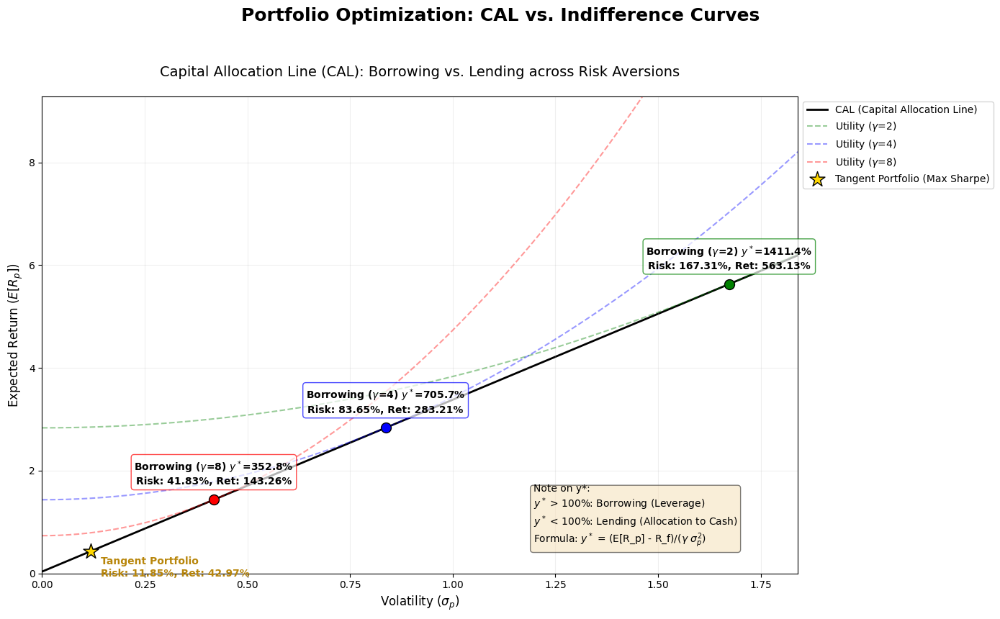

In [ ]:
# INDIFFERENCE CURVES

# This function shows how different risk aversion levels (𝛾) result in different "optimal" points where the curves touch the CAL.
# The curves (indifference curves) represent levels of equal utility, while the straight line is the Capital Allocation Line (CAL).

import numpy as np
import matplotlib.pyplot as plt

def plot_portfolio_utility(risk_free, tangency_ret, tangency_vol, gammas=[2, 4, 8]):
    # 1. Setup Data
    sharpe = (tangency_ret - risk_free) / tangency_vol
    max_y = (tangency_ret - risk_free) / (min(gammas) * (tangency_vol**2))
    max_vol = max_y * tangency_vol * 1.1
    vols = np.linspace(0, max_vol, 250)
    cal_returns = risk_free + sharpe * vols

    plt.figure(figsize=(14, 9))
    plt.plot(vols, cal_returns, color='black', linewidth=2, label='CAL (Capital Allocation Line)', zorder=1)

    # 2. Plot Curves and Points
    colors = ['green', 'blue', 'red']
    for i, g in enumerate(gammas):
        y_star = (tangency_ret - risk_free) / (g * (tangency_vol**2))
        opt_ret = risk_free + y_star * (tangency_ret - risk_free)
        opt_vol = y_star * tangency_vol
        u_max = opt_ret - 0.5 * g * (opt_vol**2)
        curve_rets = u_max + 0.5 * g * (vols**2)
        
        plt.plot(vols, curve_rets, '--', color=colors[i], alpha=0.4, label=fr'Utility ($\gamma$={g})')
        plt.scatter(opt_vol, opt_ret, color=colors[i], s=100, edgecolors='black', zorder=5)
        
        label_type = "Borrowing" if y_star > 1 else "Lending"
        # Added Risk (vol) and Return values to the annotation
        plt.annotate(fr'{label_type} ($\gamma$={g}) $y^*$={y_star:.1%}' + "\n" + fr'Risk: {opt_vol:.2%}, Ret: {opt_ret:.2%}', 
                     (opt_vol, opt_ret), xytext=(0, 15), textcoords='offset points', 
                     ha='center', fontweight='bold', bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7, ec=colors[i]))

    # 3. Tangent Portfolio Marker
    plt.scatter(tangency_vol, tangency_ret, color='gold', s=250, marker='*', 
                label='Tangent Portfolio (Max Sharpe)', zorder=6, edgecolors='black')
    
    # Added Risk and Return values to Tangent Portfolio
    plt.annotate(fr'Tangent Portfolio' + "\n" + fr'Risk: {tangency_vol:.2%}, Ret: {tangency_ret:.2%}',
                 (tangency_vol, tangency_ret), xytext=(10, -25), textcoords='offset points',
                 ha='left', fontsize=10, fontweight='bold', color='darkgoldenrod')

    # 4. Title and Subtitle
    plt.suptitle("Portfolio Optimization: CAL vs. Indifference Curves", fontsize=18, fontweight='bold', y=0.98)
    plt.title("Capital Allocation Line (CAL): Borrowing vs. Lending across Risk Aversions", fontsize=14, pad=20)
    
    # --- ADDING THE NOTE BOX ---
    note_text = (fr"Note on y*:" + "\n"
                 fr"$y^*$ > 100%: Borrowing (Leverage)" + "\n"
                 fr"$y^*$ < 100%: Lending (Allocation to Cash)" + "\n"
                 fr"Formula: $y^*$ = (E[R_p] - R_f)/($\gamma$ $\sigma_p^2$)")
    
    plt.gca().text(0.65, 0.05, note_text, transform=plt.gca().transAxes, fontsize=10,
                   verticalalignment='bottom', horizontalalignment='left',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    plt.xlabel(fr"Volatility ($\sigma_p$)", fontsize=12)
    plt.ylabel(fr"Expected Return ($E[R_p]$)", fontsize=12)
    plt.ylim(0, max(cal_returns) * 1.5)
    plt.xlim(0, max_vol)
    plt.grid(True, alpha=0.2)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

tangency_ret = vol_ret_sr_optimal[1]
tangency_vol = vol_ret_sr_optimal[0]

plot_portfolio_utility(risk_free=risk_free, tangency_ret=tangency_ret, tangency_vol=tangency_vol, gammas=[2, 4, 8])


## Indices & Portfolio

In [90]:
# ANNUAL DIVIDEND YIELDS
yields_merge = functions.plot_annual_dividnd_yields(merge_daily_returns)

Annual Dividend Yields from yf 'dividendYield' (%):


EE.UU. (S&P 500)          0
EE.UU. (NASDAQ)           0
EE.UU. (DJIA)             0
EE.UU. (Russell 100)      0
México (IPC)              0
Japón (Nikkei 225)        0
Alemania (DAX)            0
Reino Unido (FTSE 100)    0
Initial Portfolio         0
Name: dividendYield, dtype: int64

In [91]:
# --- EFFICIENT FRONTIER & CAPITAL MARKET LINE ANALYSIS---

functions.run_full_frontier_analysis(rets = merge_daily_returns,
                          curr_port_weights = weights_df['Weights'],
                          curr_port_vol = portfolio_annualized_volatility,
                          curr_port_ret = portfolio_annualized_return,
                          mean_ann = merge_daily_returns.mean() * 252,
                          cov_ann = merge_daily_returns.cov() * 252,
                          rf_default = risk_free,
                          long_only = True,  # Set to True for standard long-only constraints
                          portfolio_value = Total_invested, #100000
                          yields = yields_merge/100
                          )


Optimizing Sharpe…

Optimum Weights (%) - Tangency Portfolio
EE.UU. (S&P 500)           0.00
EE.UU. (NASDAQ)           47.51
EE.UU. (DJIA)              4.55
EE.UU. (Russell 100)       0.00
México (IPC)               0.00
Japón (Nikkei 225)         0.00
Alemania (DAX)             0.00
Reino Unido (FTSE 100)     0.00
Initial Portfolio         47.95

Optimum Sharpe Ratio: 1.844
Expected Annual Return: 30.66%
Annual Risk: 14.84%

Simulating random Portfolios…

Simulated Portfolio with Minimum Volatility:
Volatility: 9.97%
Return: 14.06%
Sharpe Ratio: 1.080

Simulated Portfolio with Maximum Return:
Volatility: 24.04%
Return: 43.41%
Sharpe Ratio: 1.668

Current Portfolio:
Volatility: 25.56%
Return: 37.19%
Sharpe Ratio: 1.326


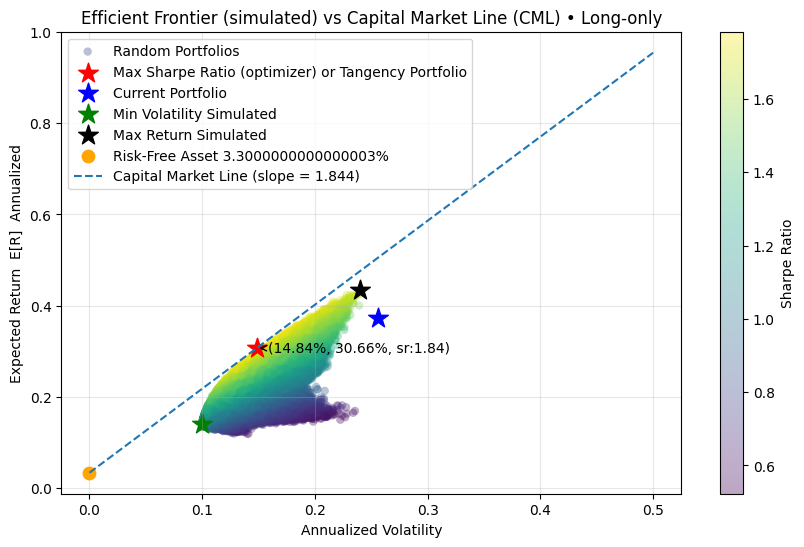

In [92]:
weights_optimal, vol_ret_sr_optimal = functions.efficient_froentier_sharp_ratio(
                merge_daily_returns,
                [portfolio_annualized_volatility, portfolio_annualized_return],
                merge_daily_returns.mean()*252, # Simple Arithmetic Mean Annualization
                merge_daily_returns.cov()*252, #Annualized Covariance
                risk_free, #Risk Free
                True, # Long only = True, Short allowed = False
                no_starts, # no. of starts (25 default)
                no_simul, # no. of simulations
                123 # seed
                )

## **TO-DO: Include GUI and "make your own portfolio" with a variety of Stocks to choose.

(see Frontera Eficiente for GUI)

# Indicators: alpha, Beta, R^2, SR, Sortino, VaR, CVaR - vs with Benchmark

| Métrica          | Valor Óptimo / Bueno                  | Interpretación                                                                 |
|------------------|---------------------------------------|---------------------------------------------------------------------------------|
| **Alpha (α)**    | > 0 (ideal: +2% a +10% anual)         | Exceso de retorno sobre lo esperado por el CAPM; positivo indica valor agregado. |
| **Beta (β)**     | ≈ 1 (mercado), <1 defensivo, >1 agresivo | Sensibilidad al mercado; >1 = más volátil, <1 = más estable.                     |
| **R² (correlación)** | > 0.8 (80% o más) | El portafolio se mueve casi igual que el benchmark (muy “indexado”).|
| **R² (correlación)** | 0.6 – 0.8                          | Buena relación con el mercado, pero con diferencias notables.|
| **R² (correlación)** | < 0.30                         | El portafolio se comporta muy distinto al mercado (alta independencia).|
| **µ (Retorno anual)** | > 8% estable, > 15% agresivo      | Rendimiento esperado anualizado del portafolio.                                 |
| **σ (Volatilidad anual)** | 10%–20% moderado, <10% defensivo, >25% muy riesgoso | Mide el riesgo total (desviación estándar).                                     |
| **Sharpe Ratio** | > 1 bueno, > 1.5 muy bueno, > 2 excelente | Retorno ajustado por riesgo total.                                              |
| **Sortino Ratio**| > 2 excelente                         | Retorno ajustado por riesgo a la baja (mejor si >> Sharpe).                     |
| **VaR (95%, 1d)**| < 2%                                  | Pérdida máxima esperada en un día con 95% de confianza.                         |
| **CVaR (95%, 1d)**| < 3%                                  | Pérdida promedio en los peores días (cola izquierda de la distribución).        |

In [93]:
#recall
display(benchmark_indices)

{'EE.UU. (S&P 500)': '^GSPC',
 'EE.UU. (NASDAQ)': '^IXIC',
 'EE.UU. (DJIA)': '^DJI',
 'EE.UU. (Russell 100)': '^RUI',
 'México (IPC)': '^MXX',
 'Japón (Nikkei 225)': '^N225',
 'Alemania (DAX)': '^GDAXI',
 'Reino Unido (FTSE 100)': '^FTSE'}

Descargando datos…

Weights: 
        Optimized Portfolio (max SR) Weights  Current Portfolio Weights
Ticker                                                                 
AAPL                                    0.00                       0.06
ADBE                                    0.00                       0.00
ASML                                    0.00                       0.01
BAC                                     0.00                       0.00
BRK-B                                   0.00                       0.00
CAT                                     0.03                       0.00
CME                                     0.17                       0.01
CRWD                                    0.00                       0.01
DIS                                     0.00                       0.02
GLD                                     0.39                       0.04
GOOG                                    0.00                       0.01
GOOGL                             

,μ anual,σ anual,Sharpe,Sortino
Current Portfolio,0.3719,0.2556,1.3260,2.2062
Portafolio (max SR),0.4297,0.1185,3.3461,5.9552
Benchmark [^GSPC],0.1762,0.1620,0.8839,NaN


Exceso risk-free usado: 3.30% anual | Rend: simple | VaR: 95% (historical)

Alpha/Beta/R²/VaR/CVaR con respecto a ^GSPC


,Alpha (anual),Beta,R²,VaR 1d,CVaR 1d
Current Portfolio,0.1386,1.3984,0.7861,0.0256,0.0374
Portafolio (max SR),0.3376,0.4123,0.3176,0.0103,0.0153


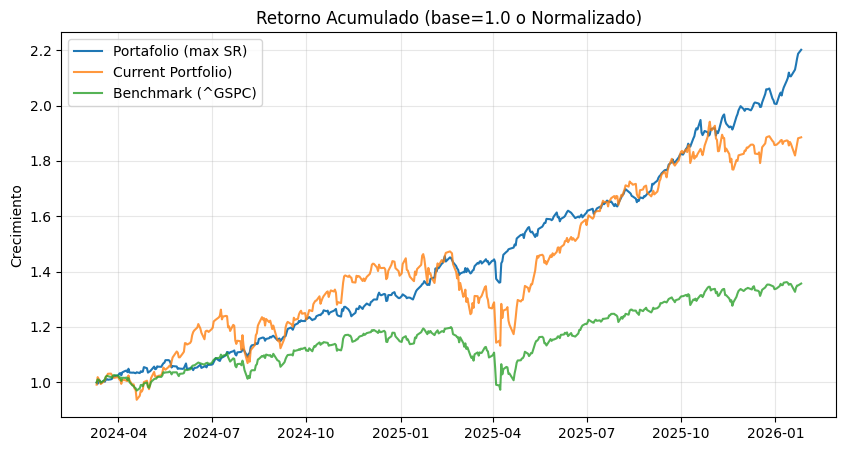

In [94]:
# Choose a benchmark to compare for alpha, beta, R2...
index_benchmark = 0

functions.indicators(tickers, start_date, today, benchmark_indices, index_benchmark,
                     risk_free, portfolio_weights=pd.Series(weights_df['Weights']), no_starts=no_starts)


## ** TO-DO: EN Metricas Anualizadas incluir de forma automatica los otros 6 benchmarks

# TO-DO: CAPM (en archivo de Indicadores)

# CAPM (Capital Asset Pricing Model)

CAPM Equation:

$$
r_{i} = r_{f} + \beta_{im}*(r_{m}-r_{f})
$$

***where*** :\
$r_i = $ Expected Asset Return\
$r_f = $ Risk-free asset Return\
$\beta_{i,m} = $ Asset Beta w.r.t market\
$r_m = $ Market Return

\
Risk-free is the minimum Return an Investor can accept.\
Difference between $r_{m}$ and $r_{f}$ is the Premium that the investor recieves by taking the risk (**equity risk Premium**).\
**$\beta$** measures the cuantity of Risk of an asset with respect to the Market.

### Asset Beta ( $\beta$ )


$$\beta = \frac{\text{Cov(}r_A, r_m\text{)}}{Var(r_m)} = \frac{\sigma_{A,m}}{\sigma_m^2} = \frac{ρ_{A,m} σ_m σ_A}{\sigma_m^2} = \frac{ρ_{A,m}σ_A}{\sigma_m}$$


# Candles

# PDF EXPORT